In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import time
import plotly.express as px
import plotly.graph_objects as go
import os
import geopandas as gpd
import libpysal as ps
import statsmodels.api as sm
import warnings
from datetime import datetime
from matplotlib.ticker import FormatStrFormatter
from pylab import rcParams
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler

pd.set_option('display.max_columns', None)
mpl.rcParams['figure.dpi'] = 150
sns.set_style("darkgrid")
sns.set_context(context="paper", font_scale=1.5)
sns.set(font="serif")
os.environ['USE_PYGEOS'] = '0'
warnings.filterwarnings('ignore')

In [2]:
os.chdir("C:\\Users\\omkarp\\Downloads\\Hannes\\Trips\\") 
data = gpd.read_file('GOT_attrib.shp')
data = data.dropna()
data = data.reset_index(drop=True)
data = data.rename(columns={'cars/pop':'CarOwnPop', '<=30 %':'Yngpop', 'malepop %':'mlepop_prop'}, errors='raise')
label_encoder = LabelEncoder()
data['month'] = label_encoder.fit_transform(data['month'])
data['Day'] = label_encoder.fit_transform(data['weekday'])
data.head()

Cannot find header.dxf (GDAL_DATA is not defined)


,BASOMRÅDE,Area_m2,month,weekday,count_trip,avg temp,max temp,min temp,avg precip,max precip,min precip,avg Wind s,max Wind s,min Wind s,daily dema,pop.dens,Higher edu,openly une,Average in,Proportion,distance,LUP_Commer,LUP_Educat,LUP_Health,LUP_Other,LUP_Public,LUP_Recrea,LUP_Reside,AreaProx,Rd_Resi,Rd_Arte,Rd_Comml,Rd_Cyc,Rd_Pedes,Rd_Other,AREA_KM2,Population,CarOwnPop,mlepop_prop,Yngpop,geometry,Day
0,10101,72488.5,0,Weekday,5.733333,9.659318,14.353333,3.980000,0.012778,0.100000,0.0,3.208667,5.093333,1.226667,3.260563,4744.285714,46.1,6.2,313100.0,0.059934,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,0.382295,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,0.07,351.0,0.19943,0.527066,0.344729,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0
1,10101,72488.5,0,Weekend,4.500000,8.454167,12.333333,4.050000,0.001389,0.033333,0.0,4.693056,6.883333,2.100000,3.260563,4744.285714,46.1,6.2,313100.0,0.059934,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,0.382295,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,0.07,351.0,0.19943,0.527066,0.344729,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",1
2,10101,72488.5,1,Weekday,5.850000,19.652986,23.848333,15.968333,0.151458,1.363333,0.0,3.078542,4.458333,1.590000,3.260563,4744.285714,46.1,6.2,313100.0,0.059934,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,0.382295,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,0.07,351.0,0.19943,0.527066,0.344729,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0
3,10101,72488.5,1,Weekend,4.125000,18.889063,22.337500,15.062500,0.007292,0.175000,0.0,3.556771,4.912500,1.787500,3.260563,4744.285714,46.1,6.2,313100.0,0.059934,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,0.382295,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,0.07,351.0,0.19943,0.527066,0.344729,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",1
4,10101,72488.5,2,Weekday,2.100000,-3.405719,-0.300000,-7.210000,0.032778,0.423333,0.0,2.932899,4.376667,1.536667,3.260563,4744.285714,46.1,6.2,313100.0,0.059934,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,0.382295,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,0.07,351.0,0.19943,0.527066,0.344729,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0


In [3]:
month_counts = data.groupby('month').size()
month_counts

month
0     757
1     868
2     761
3     883
4     884
5     843
6      60
7     822
8     843
9     804
10    790
dtype: int64

In [4]:
# Filter for January, April, August to manage the data size and model appropriateness!
new_df = data[data['month'].isin([1,8])]
new_df['month'] = new_df['month'].apply(lambda x: 1 if x == 1 else 0)
if 'month' in new_df.columns:
    # Group by 'BASOMRÅDE', 'month', and 'Day', then calculate the mean of 'count_trip'
    aggregated_data = new_df.groupby(['BASOMRÅDE', 'month', 'Day'])['count_trip'].mean().reset_index()
else:
    raise KeyError("Column 'month' not found in DataFrame")

# Step 3: Keep only the specified columns
columns_to_keep = ['BASOMRÅDE', 'Day', 'max precip', 'min Wind s', 'Proportion', 'CarOwnPop', 'Yngpop', 'Area_m2', 'AreaProx', 
                   'distance', 'LUP_Commer', 'LUP_Educat', 'LUP_Health', 'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside', 
                   'Rd_Resi', 'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other', 'Population', 'month', 'geometry']

filtered_df = new_df[columns_to_keep].copy()

# Merge aggregated data back into the filtered DataFrame using 'BASOMRÅDE', 'month', and 'Day' as keys
data = filtered_df.merge(aggregated_data, on=['BASOMRÅDE', 'month', 'Day'], how='left')

data['Trip_norm'] = (data['count_trip'] / data['Area_m2']) * 1000000
data['centroid'] = data.geometry.centroid
data['x'] = data['centroid'].x
data['y'] = data['centroid'].y

data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1711 entries, 0 to 1710
Data columns (total 31 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   BASOMRÅDE   1711 non-null   int64   
 1   Day         1711 non-null   int32   
 2   max precip  1711 non-null   float64 
 3   min Wind s  1711 non-null   float64 
 4   Proportion  1711 non-null   float64 
 5   CarOwnPop   1711 non-null   float64 
 6   Yngpop      1711 non-null   float64 
 7   Area_m2     1711 non-null   float64 
 8   AreaProx    1711 non-null   float64 
 9   distance    1711 non-null   float64 
 10  LUP_Commer  1711 non-null   float64 
 11  LUP_Educat  1711 non-null   float64 
 12  LUP_Health  1711 non-null   float64 
 13  LUP_Other   1711 non-null   float64 
 14  LUP_Public  1711 non-null   float64 
 15  LUP_Recrea  1711 non-null   float64 
 16  LUP_Reside  1711 non-null   float64 
 17  Rd_Resi     1711 non-null   float64 
 18  Rd_Arte     1711 non-null   float64 
 19

In [5]:
data.crs

<Projected CRS: EPSG:3007>
Name: SWEREF99 12 00
Axis Info [cartesian]:
- N[north]: Northing (metre)
- E[east]: Easting (metre)
Area of Use:
- name: Sweden - communes west of approximately 12°45'E and south of approximately 60°N. See information source for map.
- bounds: (10.93, 56.74, 13.11, 60.13)
Coordinate Operation:
- name: SWEREF99 12 00
- method: Transverse Mercator
Datum: SWEREF99
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

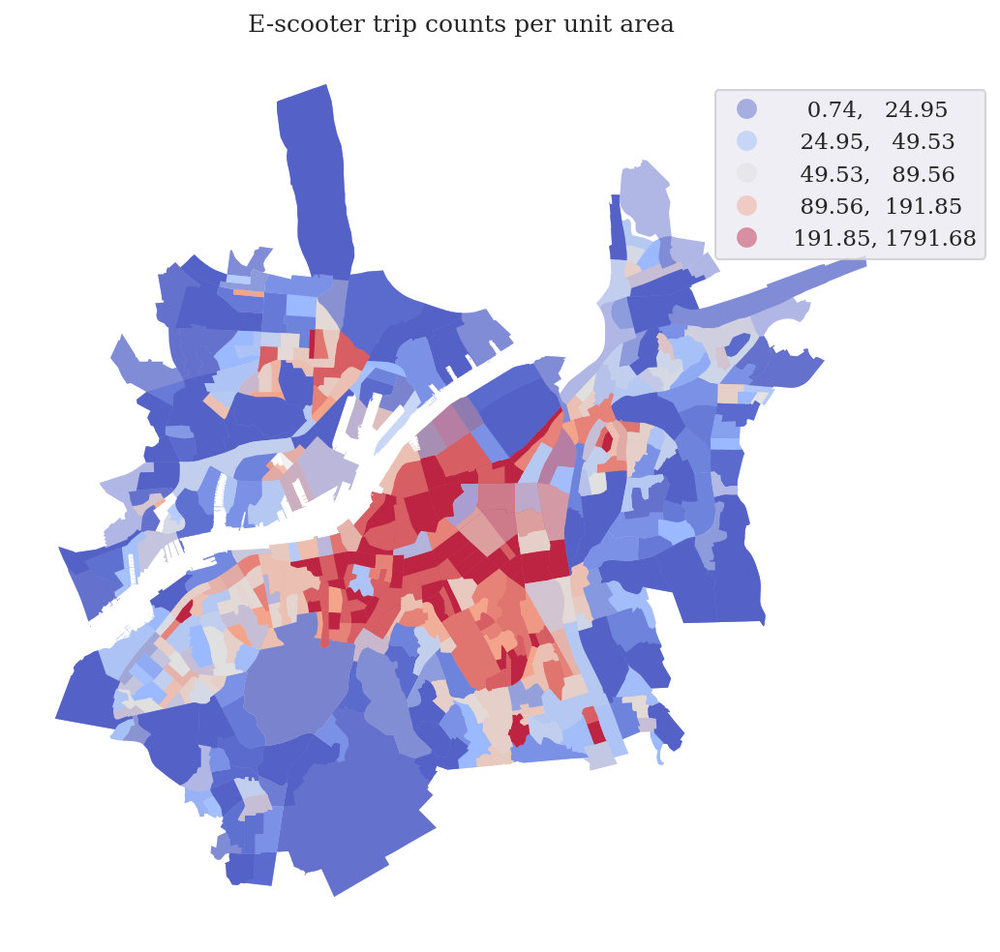

In [6]:
fig, ax = plt.subplots(figsize=(12, 8))
data.plot(column='Trip_norm', cmap='coolwarm', linewidth=0.01, scheme='quantiles', k=5, legend=True, 
         legend_kwds={'bbox_to_anchor': (1.10, 0.96)}, ax=ax, alpha=0.4)
ax.set_title('E-scooter trip counts per unit area', fontsize=12)
ax.axis("off")
plt.savefig('Tripsper_m2.png', dpi=150, bbox_inches='tight')
plt.show()

In [7]:
data.head(2)

,BASOMRÅDE,Day,max precip,min Wind s,Proportion,CarOwnPop,Yngpop,Area_m2,AreaProx,distance,LUP_Commer,LUP_Educat,LUP_Health,LUP_Other,LUP_Public,LUP_Recrea,LUP_Reside,Rd_Resi,Rd_Arte,Rd_Comml,Rd_Cyc,Rd_Pedes,Rd_Other,Population,month,geometry,count_trip,Trip_norm,centroid,x,y
0,10101,0,1.363333,1.5900,0.059934,0.19943,0.344729,72488.5,0.382295,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,1,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",5.850,80.702456,POINT (144669.156 6396644.085),144669.155907,6.396644e+06
1,10101,1,0.175000,1.7875,0.059934,0.19943,0.344729,72488.5,0.382295,926.948256,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,1,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",4.125,56.905578,POINT (144669.156 6396644.085),144669.155907,6.396644e+06


In [8]:
data.columns

Index(['BASOMRÅDE', 'Day', 'max precip', 'min Wind s', 'Proportion',
       'CarOwnPop', 'Yngpop', 'Area_m2', 'AreaProx', 'distance', 'LUP_Commer',
       'LUP_Educat', 'LUP_Health', 'LUP_Other', 'LUP_Public', 'LUP_Recrea',
       'LUP_Reside', 'Rd_Resi', 'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes',
       'Rd_Other', 'Population', 'month', 'geometry', 'count_trip',
       'Trip_norm', 'centroid', 'x', 'y'],
      dtype='object')

# Feature Selection

In [9]:
df=data
colums= ['month','Day','max precip','min Wind s', 'Proportion','CarOwnPop','Yngpop','Area_m2','AreaProx',
         'distance', 'LUP_Commer', 'LUP_Educat', 'LUP_Health', 'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside', 
         'Rd_Resi', 'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other', 'Population']

#'Proportion of students'

df.replace([np.inf, -np.inf, np.nan], 0, inplace=True)
col_test = df[colums]

vif_data = pd.DataFrame()
vif_data["feature"] = col_test.columns
vif_data["VIF"] = [variance_inflation_factor(col_test.values.astype(float), i)
                          for i in range(len(col_test.columns))]

print(vif_data.to_string(index=False, float_format='%.2f'))

   feature   VIF
     month  4.73
       Day  3.06
max precip  3.58
min Wind s 32.38
Proportion  5.27
 CarOwnPop  7.90
    Yngpop  6.97
   Area_m2  9.59
  AreaProx  2.92
  distance 39.95
LUP_Commer  7.64
LUP_Educat  2.06
LUP_Health  1.51
 LUP_Other  4.42
LUP_Public  1.94
LUP_Recrea  4.95
LUP_Reside  9.65
   Rd_Resi  3.43
   Rd_Arte  2.05
  Rd_Comml  3.14
    Rd_Cyc  3.85
  Rd_Pedes  7.39
  Rd_Other  2.55
Population  4.90


In [10]:
sorted_feature_names = vif_data['feature'].tolist()
print(len(sorted_feature_names))
# sorted_feature_names=sorted_feature_names.tolist()
sorted_feature_names

24


['month',
 'Day',
 'max precip',
 'min Wind s',
 'Proportion',
 'CarOwnPop',
 'Yngpop',
 'Area_m2',
 'AreaProx',
 'distance',
 'LUP_Commer',
 'LUP_Educat',
 'LUP_Health',
 'LUP_Other',
 'LUP_Public',
 'LUP_Recrea',
 'LUP_Reside',
 'Rd_Resi',
 'Rd_Arte',
 'Rd_Comml',
 'Rd_Cyc',
 'Rd_Pedes',
 'Rd_Other',
 'Population']

[Text(0, 0.5, 'month'),
 Text(0, 1.5, 'Day'),
 Text(0, 2.5, 'max precip'),
 Text(0, 3.5, 'min Wind s'),
 Text(0, 4.5, 'Proportion'),
 Text(0, 5.5, 'CarOwnPop'),
 Text(0, 6.5, 'Yngpop'),
 Text(0, 7.5, 'Area_m2'),
 Text(0, 8.5, 'AreaProx'),
 Text(0, 9.5, 'distance'),
 Text(0, 10.5, 'LUP_Commer'),
 Text(0, 11.5, 'LUP_Educat'),
 Text(0, 12.5, 'LUP_Health'),
 Text(0, 13.5, 'LUP_Other'),
 Text(0, 14.5, 'LUP_Public'),
 Text(0, 15.5, 'LUP_Recrea'),
 Text(0, 16.5, 'LUP_Reside'),
 Text(0, 17.5, 'Rd_Resi'),
 Text(0, 18.5, 'Rd_Arte'),
 Text(0, 19.5, 'Rd_Comml'),
 Text(0, 20.5, 'Rd_Cyc'),
 Text(0, 21.5, 'Rd_Pedes'),
 Text(0, 22.5, 'Rd_Other'),
 Text(0, 23.5, 'Population')]

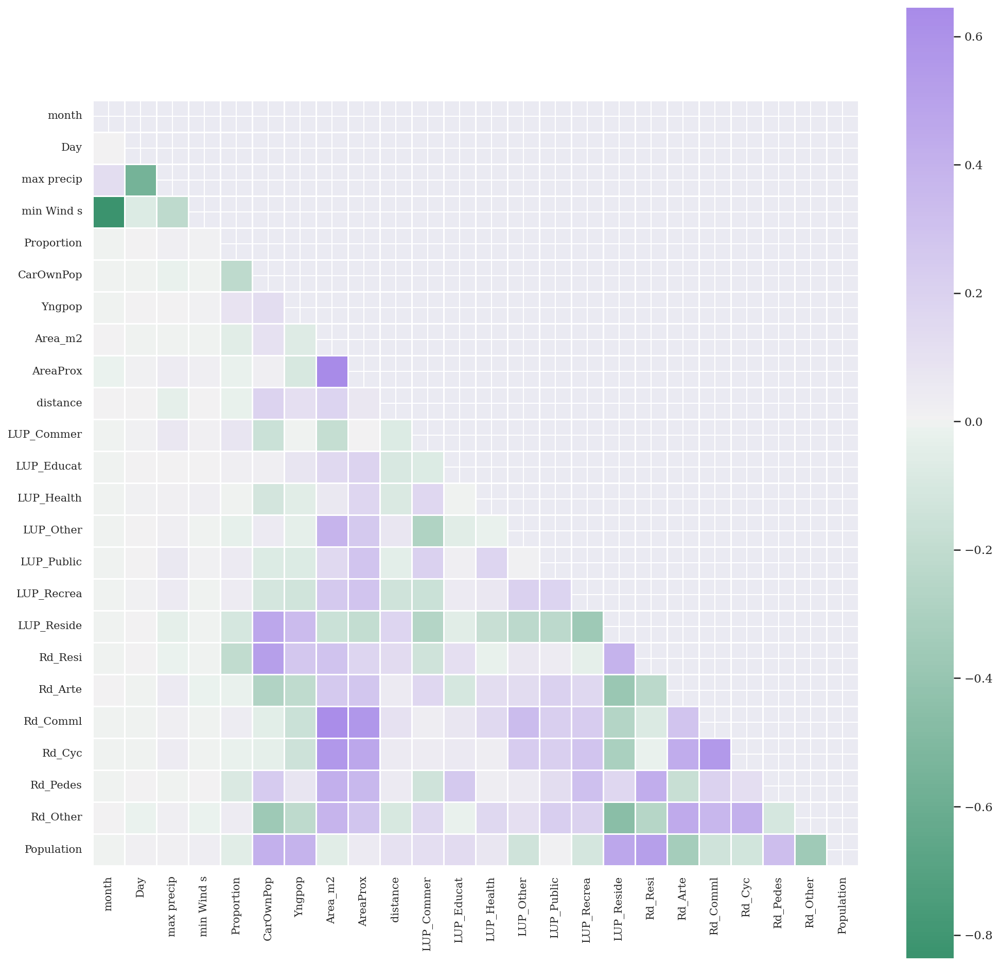

In [11]:
# Features to remove for better correlation (< 70% )
# sorted_feature_names.remove('avg temp')
# sorted_feature_names.remove('avg precip')
# sorted_feature_names.remove('max temp')
# sorted_feature_names.remove('avg Wind speed')

features_1 = sorted_feature_names
corr = data[features_1].corr('spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(16, 16))
cmap = sns.diverging_palette(150, 275, s=80, l=55, n=9, as_cmap=True)
g = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=None, center=0,square=True,linewidths=.5, cbar_kws={"shrink": 1})
g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 10)
g.set_yticklabels(g.get_ymajorticklabels(), fontsize = 10)

In [12]:
sorted_feature_names = vif_data[vif_data['VIF'] < 15]['feature']
features_1=sorted_feature_names
print(len(features_1))
col_test = df[sorted_feature_names]
df.replace([np.inf, -np.inf, np.nan], 0, inplace=True)
vif_data = pd.DataFrame()
vif_data["feature"] = col_test.columns
vif_data["VIF"] = [variance_inflation_factor(col_test.values.astype(float), i)
                          for i in range(len(col_test.columns))]

vif_data = vif_data.sort_values(by="VIF", ascending=False)
print(vif_data.to_string(index=False, float_format='%.2f'))

22
   feature  VIF
   Area_m2 9.54
 CarOwnPop 7.88
  Rd_Pedes 7.38
    Yngpop 6.97
Population 4.90
Proportion 4.84
LUP_Reside 4.48
    Rd_Cyc 3.83
LUP_Commer 3.58
max precip 3.52
   Rd_Resi 3.40
  Rd_Comml 3.13
       Day 2.93
  AreaProx 2.92
     month 2.78
LUP_Recrea 2.71
  Rd_Other 2.54
 LUP_Other 2.38
   Rd_Arte 2.04
LUP_Public 1.60
LUP_Educat 1.48
LUP_Health 1.22


In [13]:
features_1 = features_1.tolist()
columns_to_select = features_1 + ['count_trip', 'x', 'y','BASOMRÅDE','geometry']
df = data[columns_to_select]
df.head(2)

,month,Day,max precip,Proportion,CarOwnPop,Yngpop,Area_m2,AreaProx,LUP_Commer,LUP_Educat,LUP_Health,LUP_Other,LUP_Public,LUP_Recrea,LUP_Reside,Rd_Resi,Rd_Arte,Rd_Comml,Rd_Cyc,Rd_Pedes,Rd_Other,Population,count_trip,x,y,BASOMRÅDE,geometry
0,1,0,1.363333,0.059934,0.19943,0.344729,72488.5,0.382295,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,5.850,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445..."
1,1,1,0.175000,0.059934,0.19943,0.344729,72488.5,0.382295,0.433173,0.0,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,4.125,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445..."


In [14]:
X = df[features_1].values
y = df['count_trip'].values.reshape((-1,1))
u = df['x']
v = df['y']
coords = list(zip(u,v))
print(X.shape, y.shape)

(1711, 22) (1711, 1)


# GWR model

In [15]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print(X_scaled.shape, y.shape)
print("Optimizing bandwidth for the GWR model...")
start_time = time.time()
gwr_selector = Sel_BW(coords, y, X_scaled)
gwr_bw = gwr_selector.search()
end_time = time.time()
print(f"Time taken for feature selection: {end_time - start_time:.2f} seconds")
print('GWR bandwidth =', gwr_bw)

(1711, 22) (1711, 1)
Optimizing bandwidth for the GWR model...
Time taken for feature selection: 26.80 seconds
GWR bandwidth = 164.0


In [16]:
# Optimizing feature selection for accuracy criteria (AIC)
num_covariates = X_scaled.shape[1]

selected_features = []
print("Selecting features using a stepped regression...")
start_time = time.time()

for i in range(num_covariates):
    best_aic = float('inf')
    best_feature = None
    
    for j in range(num_covariates):
        if j not in selected_features:
            current_features = selected_features + [j]
            X_current = X_scaled[:, current_features]
            
            model = sm.OLS(y, X_current).fit()
            current_aic = model.aic
            
            if current_aic < best_aic:
                best_aic = current_aic
                best_feature = j
                
    if best_feature is not None:
        selected_features.append(best_feature)
        
        selected_X = X_scaled[:, selected_features]
        gwr_results = GWR(coords, y, selected_X, gwr_bw).fit()
        
end_time = time.time()
print(f"Time taken for feature selection: {end_time - start_time:.2f} seconds")
feature_names = df.columns.drop(['count_trip', 'BASOMRÅDE', 'x', 'y', 'geometry'])
selected_feature_names = [feature_names[i] for i in selected_features]
print("Selected feature names:", selected_feature_names)

Selecting features using a stepped regression...
Time taken for feature selection: 38.87 seconds
Selected feature names: ['AreaProx', 'LUP_Commer', 'month', 'Rd_Comml', 'LUP_Public', 'Rd_Arte', 'Day', 'LUP_Recrea', 'Population', 'CarOwnPop', 'Proportion', 'Rd_Pedes', 'Area_m2', 'Rd_Other', 'Rd_Cyc', 'max precip', 'Rd_Resi', 'LUP_Educat', 'LUP_Health', 'LUP_Reside', 'LUP_Other', 'Yngpop']


In [17]:
start_time = time.time()
print("Current time:", datetime.now())

try:
    print("Starting GWR fitting...")
    gwr_results = GWR(coords, y, X_scaled, gwr_bw).fit()
    end_time = time.time()
    print(f"Time taken for GWR fitting: {end_time - start_time:.2f} seconds")
    num_observations = gwr_results.n
    print("Number of observations:", num_observations)
    print("GWR Summary:")
    gwr_summary = gwr_results.summary()
    print(gwr_summary)

except Exception as e:
    print("Error encountered:", e)
    end_time = time.time()
    print(f"Time elapsed before error: {end_time - start_time:.2f} seconds")

Current time: 2024-01-17 01:24:56.554895
Starting GWR fitting...
Time taken for GWR fitting: 2.43 seconds
Number of observations: 1711
GWR Summary:
Model type                                                         Gaussian
Number of observations:                                                1711
Number of covariates:                                                    23

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                         150167.773
Log-likelihood:                                                   -6255.888
AIC:                                                              12557.777
AICc:                                                             12560.489
BIC:                                                             137600.895
R2:                                                                   0.418
Adj. R2:                                                         

In [18]:
predicted_values = gwr_results.predy
actual_values = y
df['gwr_R2'] = gwr_results.localR2

mse = mean_squared_error(actual_values, predicted_values)
mae = mean_absolute_error(actual_values, predicted_values)
rmse = mse ** 0.5

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("Root Mean Squared Error:", rmse)
print('R2 =', gwr_results.R2)
print('AIC =', gwr_results.aic)
print('AICc =', gwr_results.aicc)

Mean Squared Error: 17.94657133389339
Mean Absolute Error: 2.10132862702259
Root Mean Squared Error: 4.236339378979615
R2 = 0.8810024150238783
AIC = 10634.744294843402
AICc = 10907.972557552304


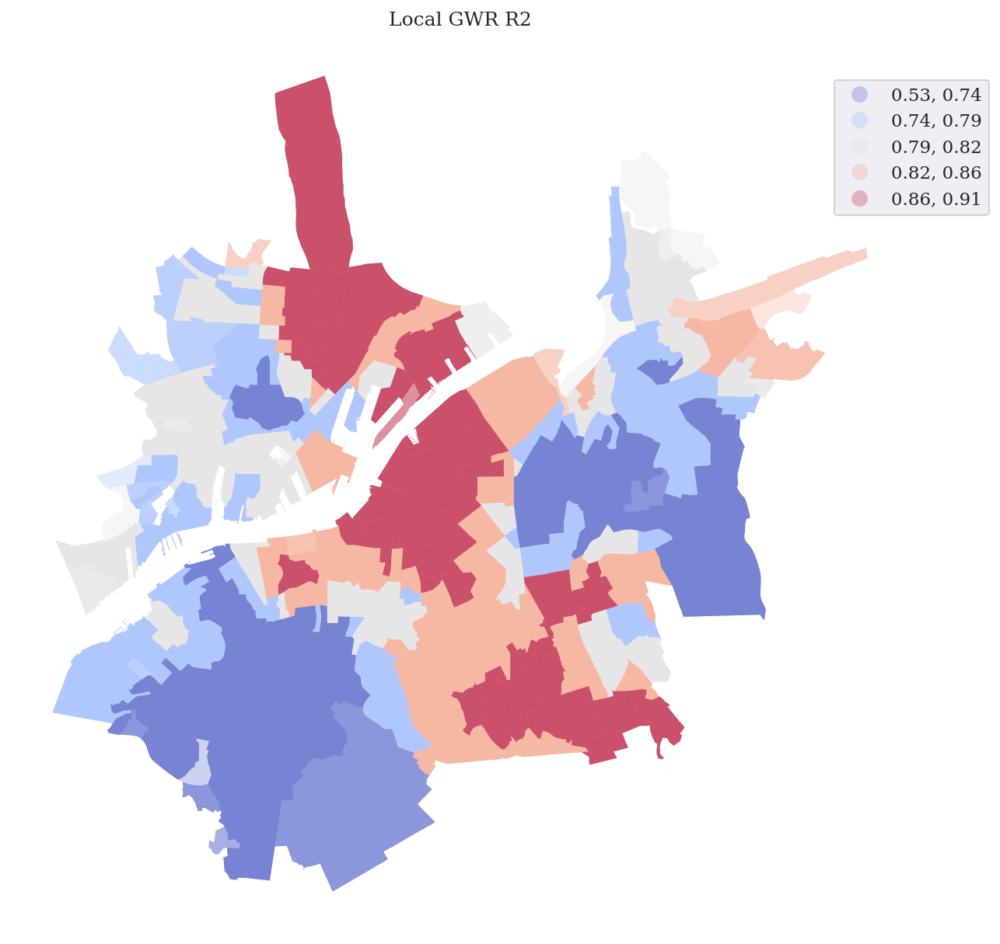

In [19]:
fig, ax = plt.subplots(figsize=(10, 10))
df.plot(column='gwr_R2', cmap = 'coolwarm', linewidth=0.01, scheme = 'quantiles', k=5, legend=True, 
         legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=ax, alpha=0.80)
ax.set_title('Local GWR R2', fontsize=12)
ax.axis("off")
plt.savefig('GWR_R2.png',dpi=150, bbox_inches='tight')
plt.show()

In [20]:
for i, feature in enumerate(features_1):   df[f'gwr_{feature}'] = gwr_results.params[:, i].round(2)
df.head()

,month,Day,max precip,Proportion,CarOwnPop,Yngpop,Area_m2,AreaProx,LUP_Commer,LUP_Educat,LUP_Health,LUP_Other,LUP_Public,LUP_Recrea,LUP_Reside,Rd_Resi,Rd_Arte,Rd_Comml,Rd_Cyc,Rd_Pedes,Rd_Other,Population,count_trip,x,y,BASOMRÅDE,geometry,gwr_R2,gwr_month,gwr_Day,gwr_max precip,gwr_Proportion,gwr_CarOwnPop,gwr_Yngpop,gwr_Area_m2,gwr_AreaProx,gwr_LUP_Commer,gwr_LUP_Educat,gwr_LUP_Health,gwr_LUP_Other,gwr_LUP_Public,gwr_LUP_Recrea,gwr_LUP_Reside,gwr_Rd_Resi,gwr_Rd_Arte,gwr_Rd_Comml,gwr_Rd_Cyc,gwr_Rd_Pedes,gwr_Rd_Other,gwr_Population
0,1,0,1.363333,0.059934,0.199430,0.344729,72488.5,0.382295,0.433173,0.00000,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,5.850000,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0.780256,4.16,0.56,-0.11,0.09,-0.06,0.21,0.28,2.39,-2.09,0.73,0.17,0.57,0.59,0.21,0.37,0.23,0.64,-0.25,2.20,0.87,-1.26,-0.06
1,1,1,0.175000,0.059934,0.199430,0.344729,72488.5,0.382295,0.433173,0.00000,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,4.125000,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0.780256,4.16,0.56,-0.11,0.09,-0.06,0.21,0.28,2.39,-2.09,0.73,0.17,0.57,0.59,0.21,0.37,0.23,0.64,-0.25,2.20,0.87,-1.26,-0.06
2,0,0,0.296667,0.059934,0.199430,0.344729,72488.5,0.382295,0.433173,0.00000,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,3.833333,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0.780256,4.16,0.56,-0.11,0.09,-0.06,0.21,0.28,2.39,-2.09,0.73,0.17,0.57,0.59,0.21,0.37,0.23,0.64,-0.25,2.20,0.87,-1.26,-0.06
3,0,1,0.366667,0.059934,0.199430,0.344729,72488.5,0.382295,0.433173,0.00000,0.0,0.09274,0.387015,0.0,0.087072,186.489991,2166.617857,1323.043464,681.868716,963.726336,6.579349,351.0,1.500000,144669.155907,6.396644e+06,10101,"POLYGON Z ((144590.135 6396532.436 0.000, 1445...",0.780256,4.16,0.56,-0.11,0.09,-0.06,0.21,0.28,2.39,-2.09,0.73,0.17,0.57,0.59,0.21,0.37,0.23,0.64,-0.25,2.20,0.87,-1.26,-0.06
4,1,0,1.350000,0.059934,0.205167,0.343465,31282.1,0.241274,0.248263,0.28734,0.0,0.00000,0.277261,0.0,0.187136,462.337346,0.000000,212.327457,28.052074,1804.743632,0.000000,658.0,2.600000,144919.047157,6.396631e+06,10102,"POLYGON Z ((144791.208 6396646.582 0.000, 1448...",0.775111,5.99,0.46,-0.09,0.16,-0.09,-0.70,0.20,6.56,-1.89,-4.36,-2.53,-1.16,-3.61,-1.51,-3.85,-4.92,0.40,-1.00,4.74,-0.14,-0.60,-0.56


In [21]:
# Filter t-values: standard alpha = 0.05
gwr_filtered_t = gwr_results.filter_tvals(alpha = 0.05)
# Filter t-values: corrected alpha due to multiple testing
gwr_filtered_tc = gwr_results.filter_tvals()
df.columns

Index(['month', 'Day', 'max precip', 'Proportion', 'CarOwnPop', 'Yngpop',
       'Area_m2', 'AreaProx', 'LUP_Commer', 'LUP_Educat', 'LUP_Health',
       'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside', 'Rd_Resi',
       'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other', 'Population',
       'count_trip', 'x', 'y', 'BASOMRÅDE', 'geometry', 'gwr_R2', 'gwr_month',
       'gwr_Day', 'gwr_max precip', 'gwr_Proportion', 'gwr_CarOwnPop',
       'gwr_Yngpop', 'gwr_Area_m2', 'gwr_AreaProx', 'gwr_LUP_Commer',
       'gwr_LUP_Educat', 'gwr_LUP_Health', 'gwr_LUP_Other', 'gwr_LUP_Public',
       'gwr_LUP_Recrea', 'gwr_LUP_Reside', 'gwr_Rd_Resi', 'gwr_Rd_Arte',
       'gwr_Rd_Comml', 'gwr_Rd_Cyc', 'gwr_Rd_Pedes', 'gwr_Rd_Other',
       'gwr_Population'],
      dtype='object')

In [22]:
# Since the coefficients are the same for 'BASOMRÅDE', we group and aggregate temporal data.
df_gwr = df.drop(columns=['x', 'y'])
numeric_cols = df_gwr.select_dtypes(include=['number']).columns
df_gwr_numeric = df_gwr.groupby('BASOMRÅDE')[numeric_cols].mean()
df_geometry = df_gwr.drop_duplicates('BASOMRÅDE')[['BASOMRÅDE', 'geometry']].set_index('BASOMRÅDE')
df_gwr = df_gwr_numeric.merge(df_geometry, left_index=True, right_index=True)
df_gwr = gpd.GeoDataFrame(df_gwr, geometry='geometry')
df_gwr.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 445 entries, 10101 to 70902
Data columns (total 48 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   month           445 non-null    float64 
 1   Day             445 non-null    float64 
 2   max precip      445 non-null    float64 
 3   Proportion      445 non-null    float64 
 4   CarOwnPop       445 non-null    float64 
 5   Yngpop          445 non-null    float64 
 6   Area_m2         445 non-null    float64 
 7   AreaProx        445 non-null    float64 
 8   LUP_Commer      445 non-null    float64 
 9   LUP_Educat      445 non-null    float64 
 10  LUP_Health      445 non-null    float64 
 11  LUP_Other       445 non-null    float64 
 12  LUP_Public      445 non-null    float64 
 13  LUP_Recrea      445 non-null    float64 
 14  LUP_Reside      445 non-null    float64 
 15  Rd_Resi         445 non-null    float64 
 16  Rd_Arte         445 non-null    float64 
 17  Rd_Comm

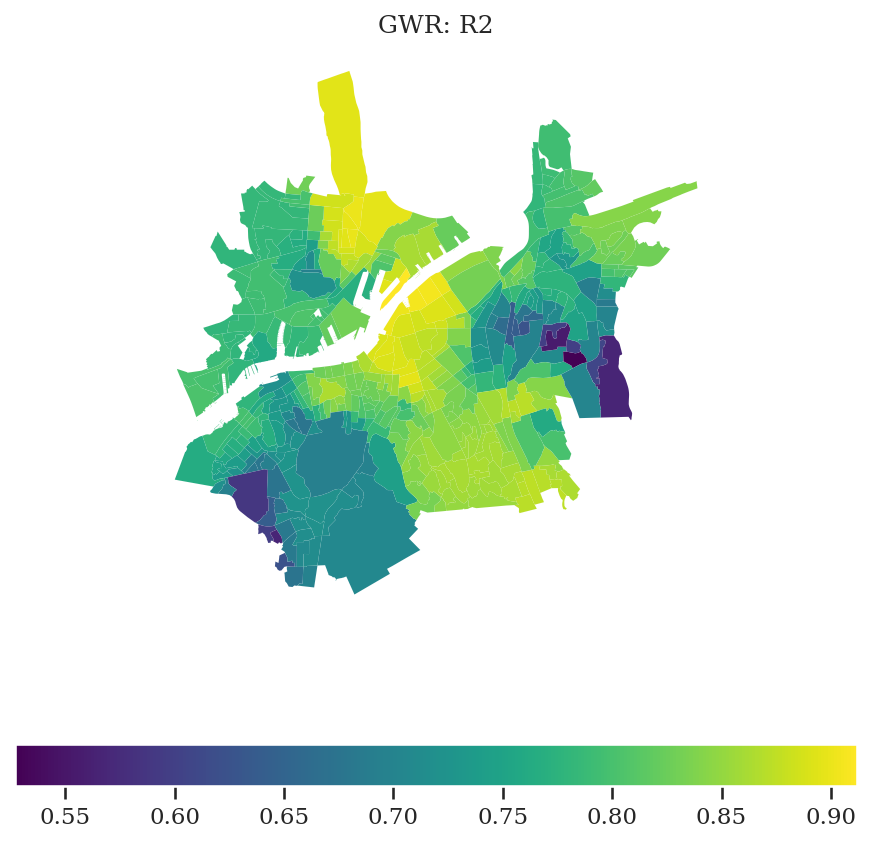

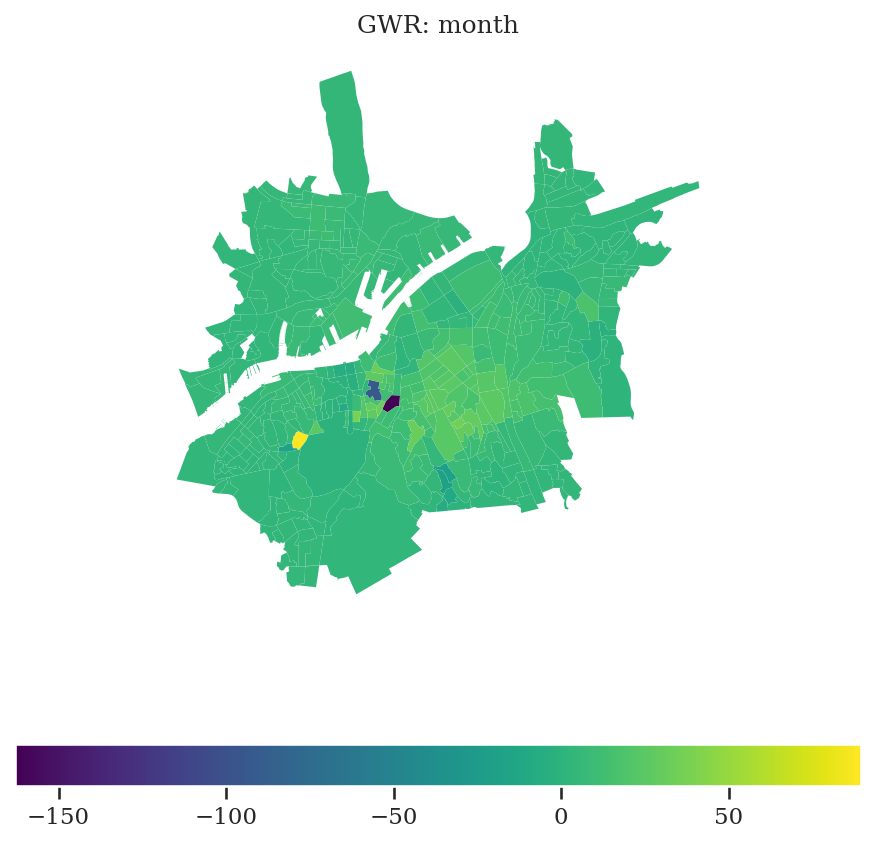

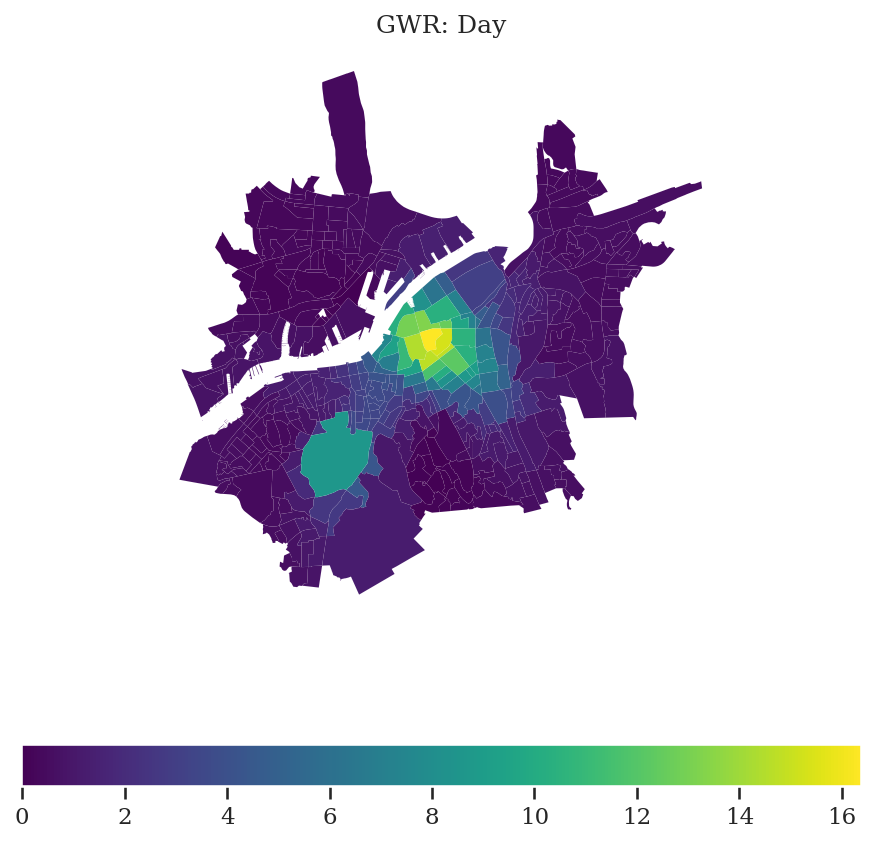

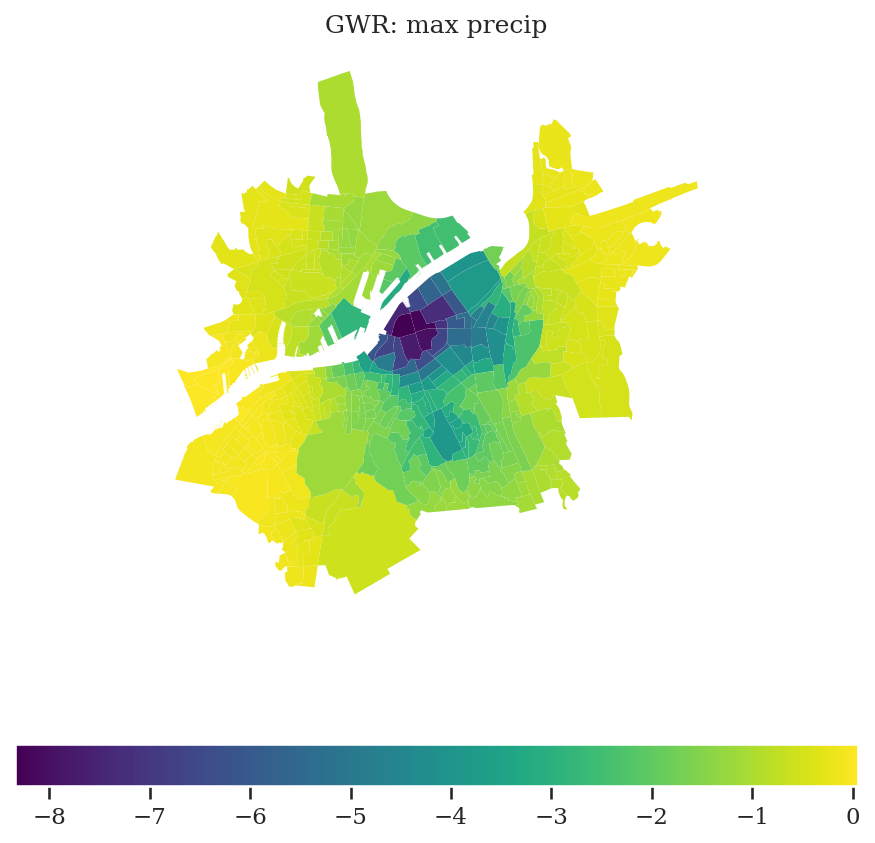

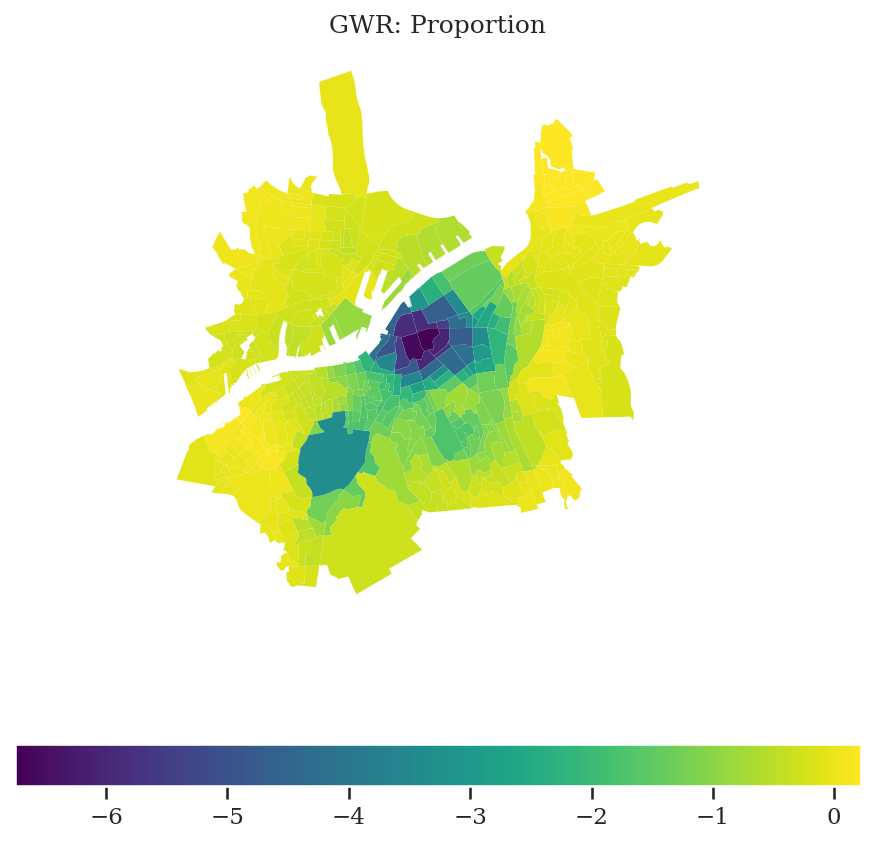

...

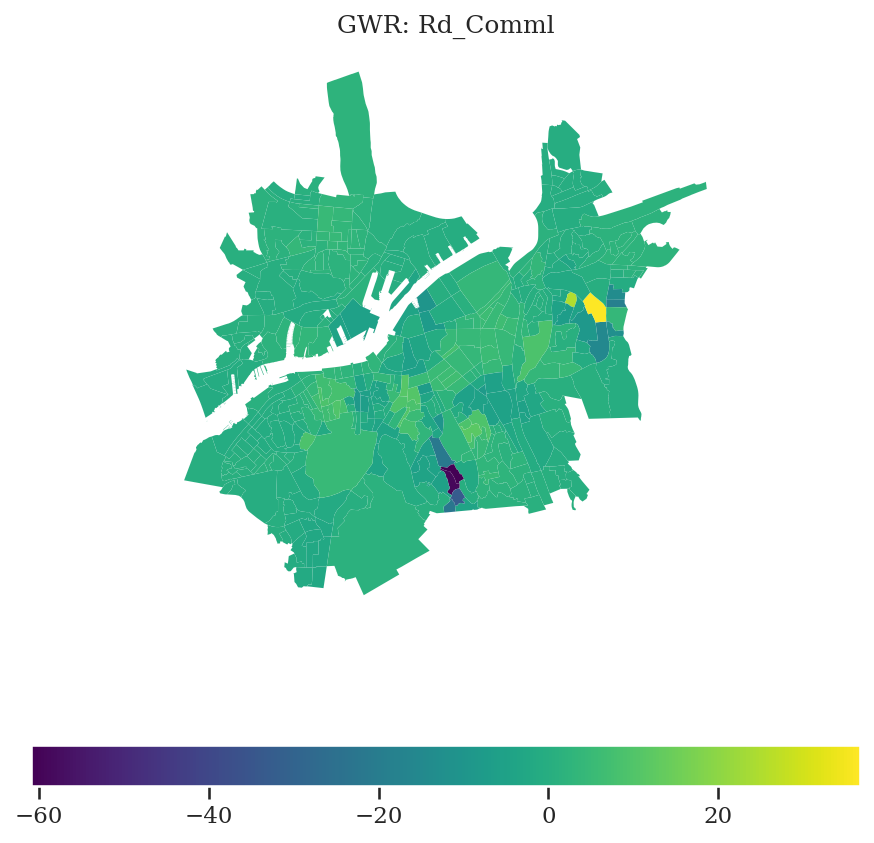

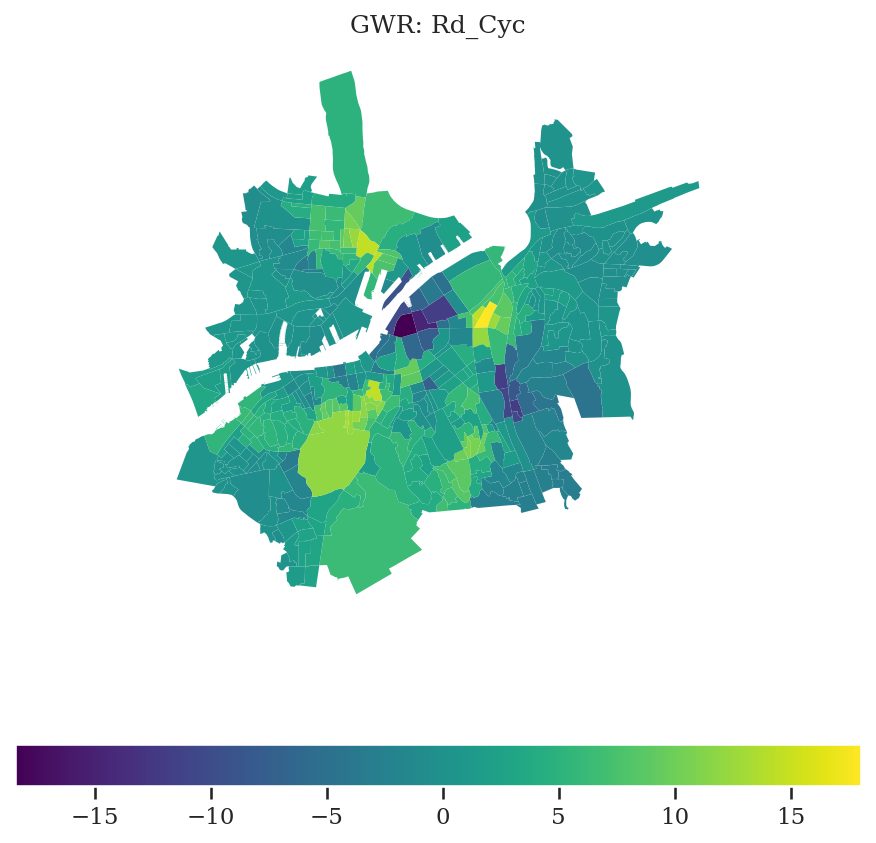

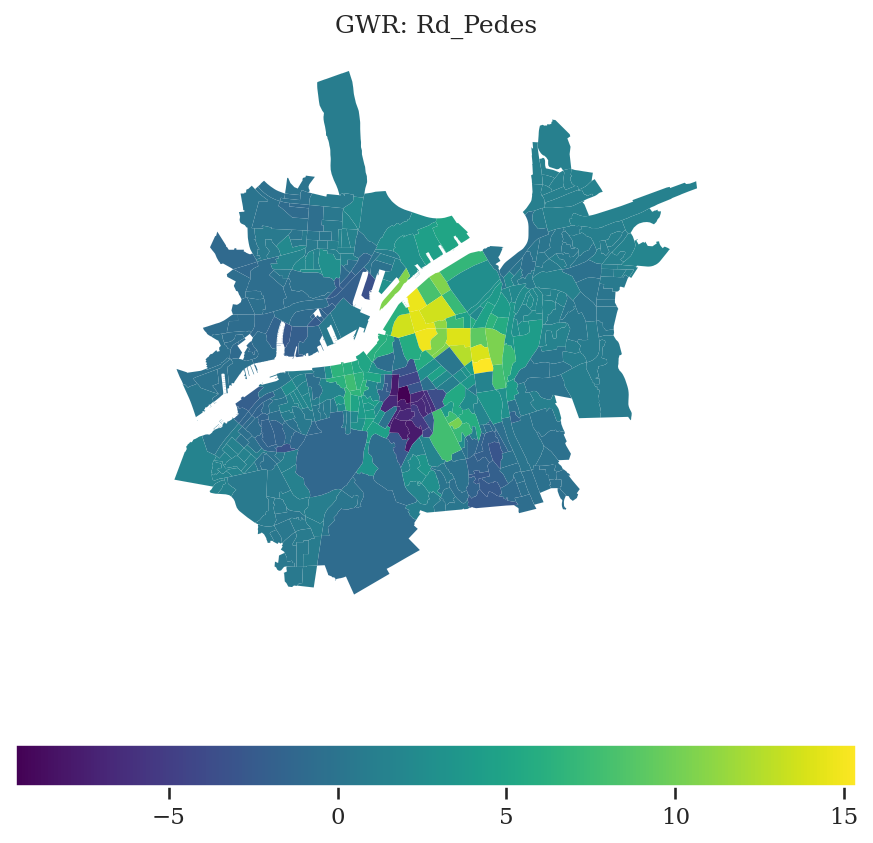

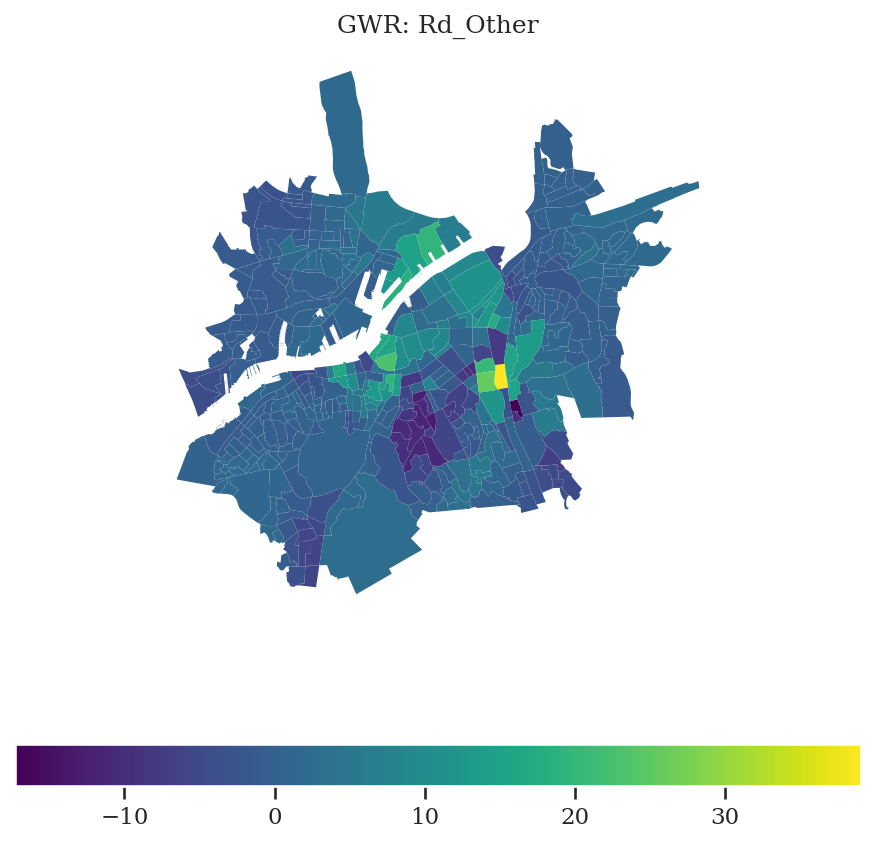

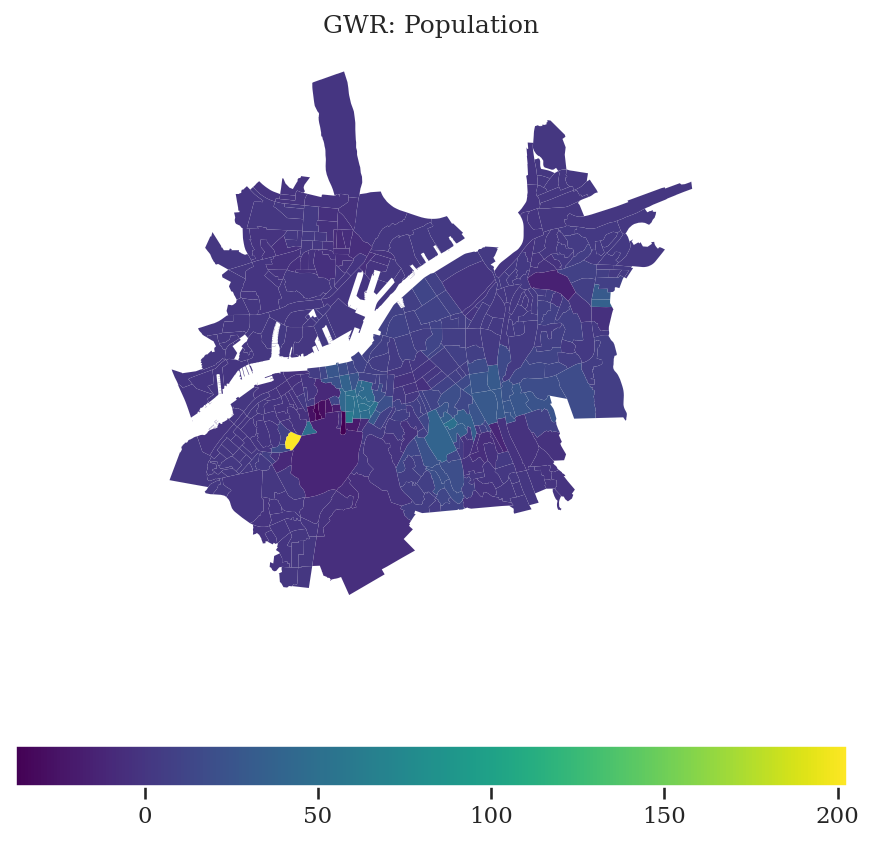

In [23]:
gwr_coefficient_cols = [col for col in df_gwr.columns if col.startswith('gwr_')]
i = 0
for coeff_col in gwr_coefficient_cols:
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    cmap = 'viridis'
    # Plotting with equal interval breaks
    df_gwr.plot(column=coeff_col, cmap=cmap, linewidth=0.01, 
                legend=True, legend_kwds={'orientation': 'horizontal'},ax=ax)
    plt.tight_layout()
    ax.axis("off")
    feature_name = coeff_col.replace('gwr_', '')
    ax.set_title(f'GWR: {feature_name}', fontsize=12)
    plt.savefig(f'{i}_GWR_{feature_name}.png', dpi=150, bbox_inches='tight')
    i += 1
    plt.show()

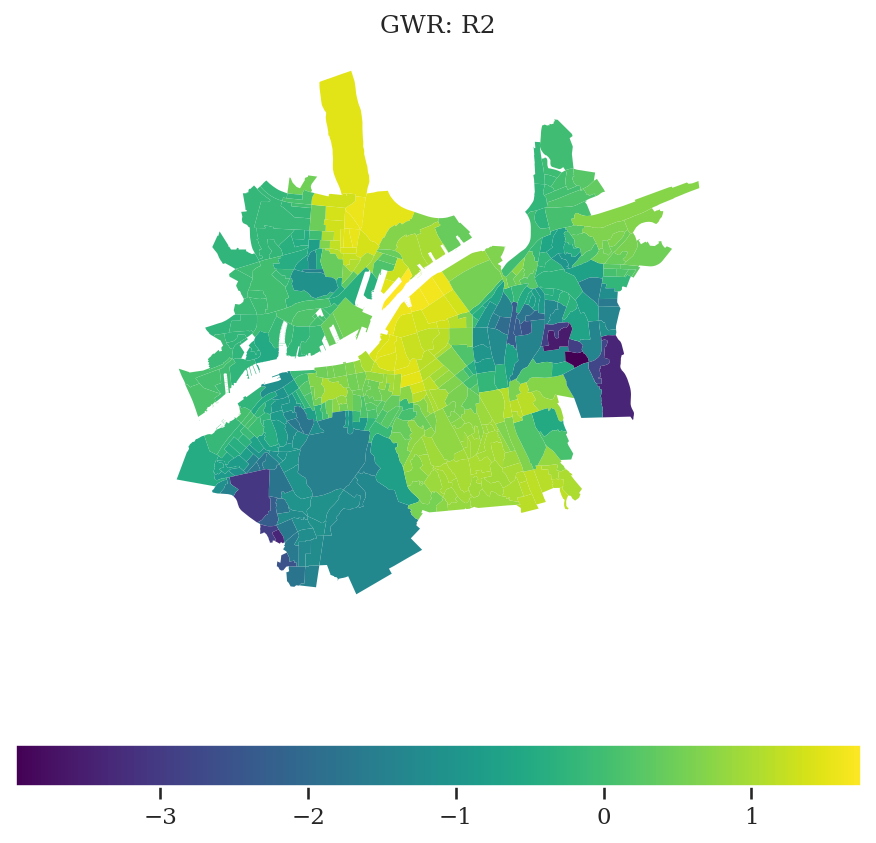

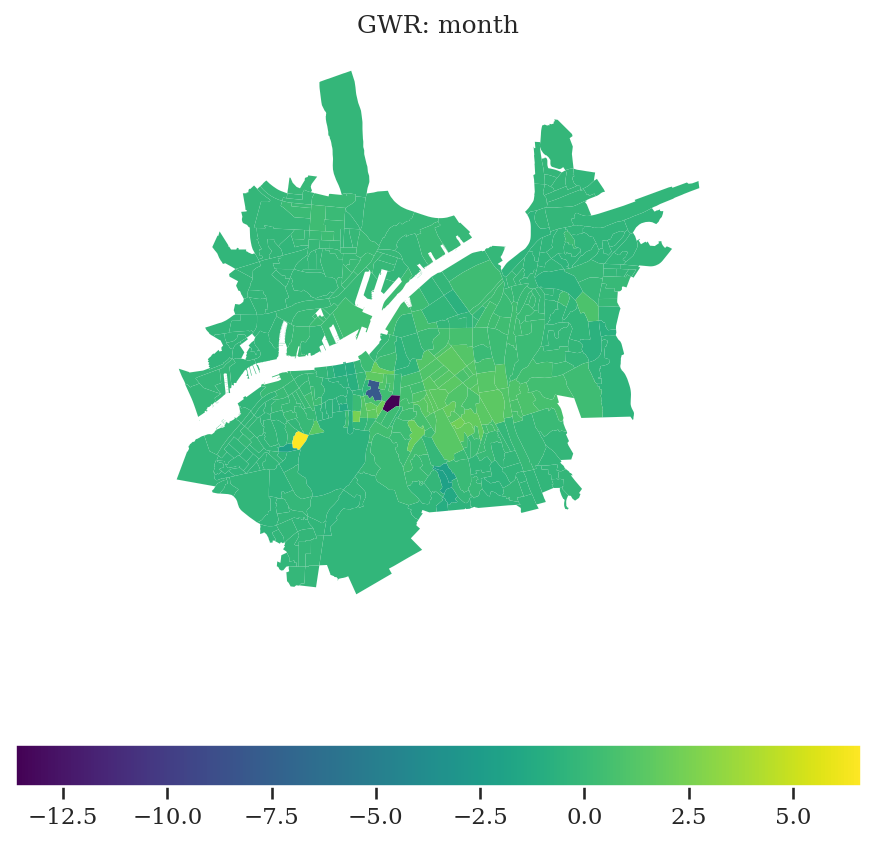

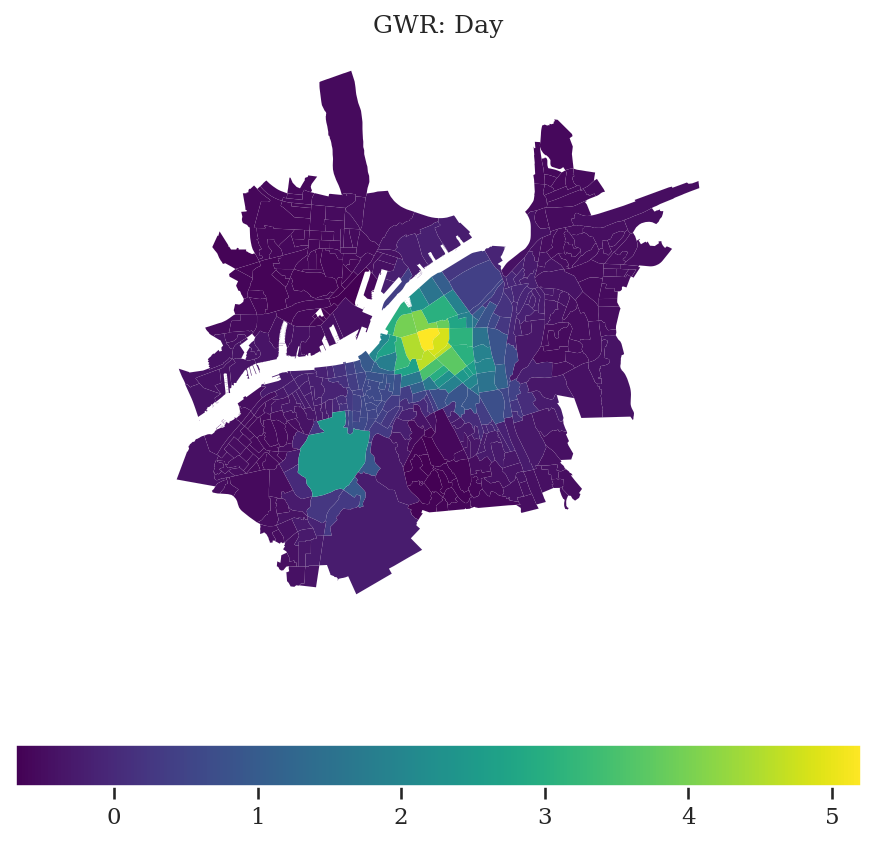

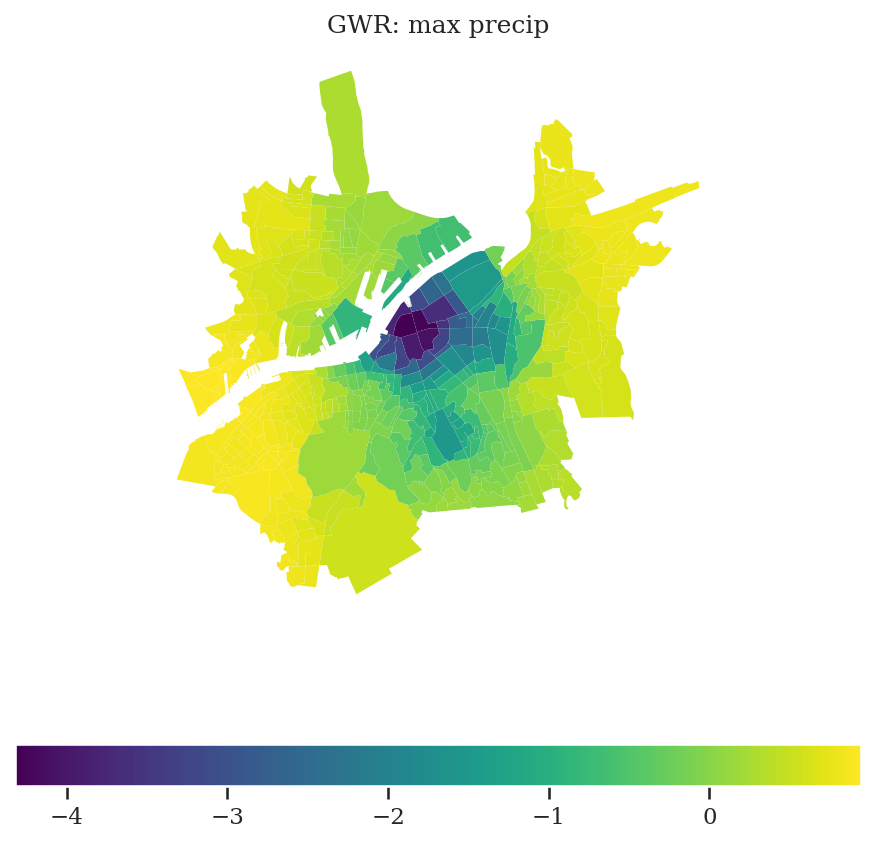

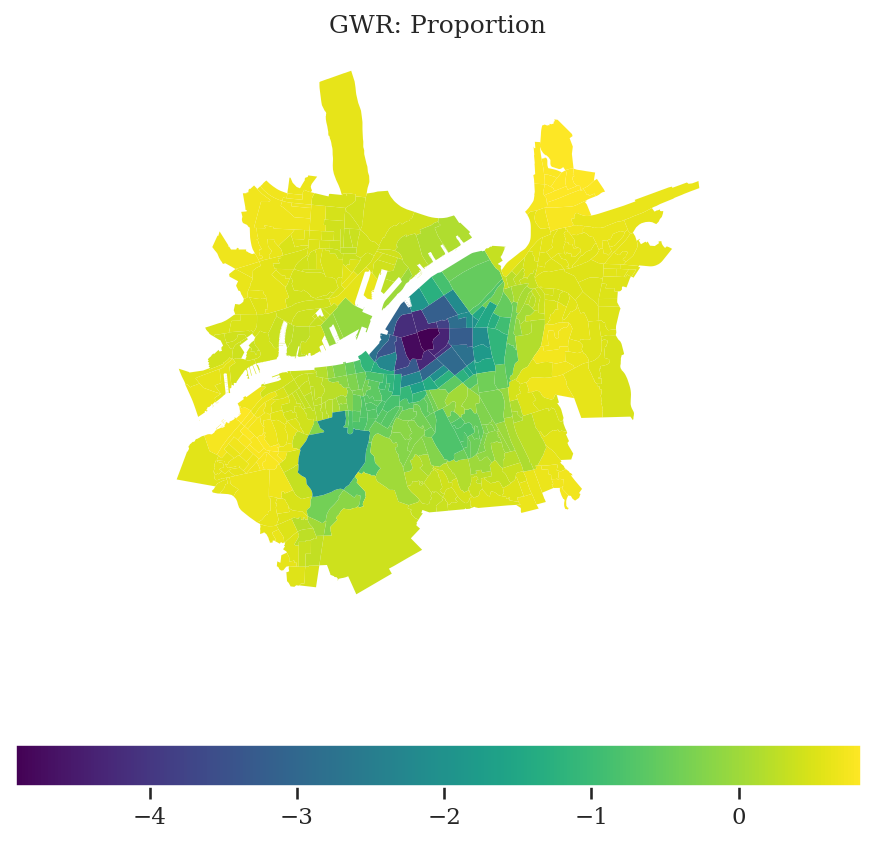

...

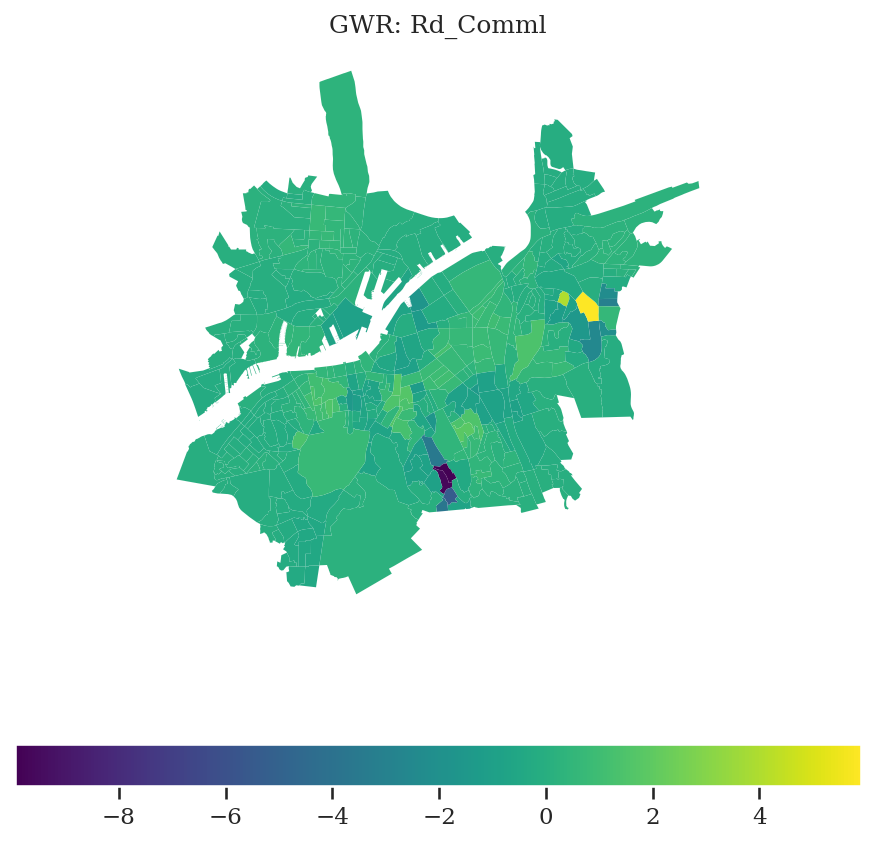

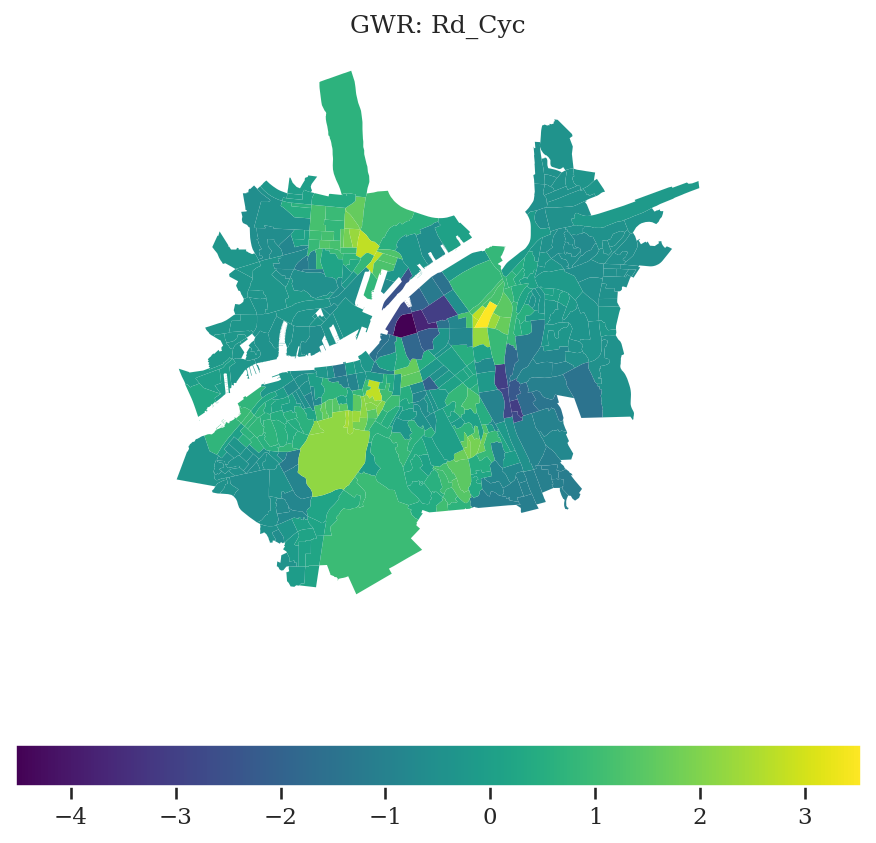

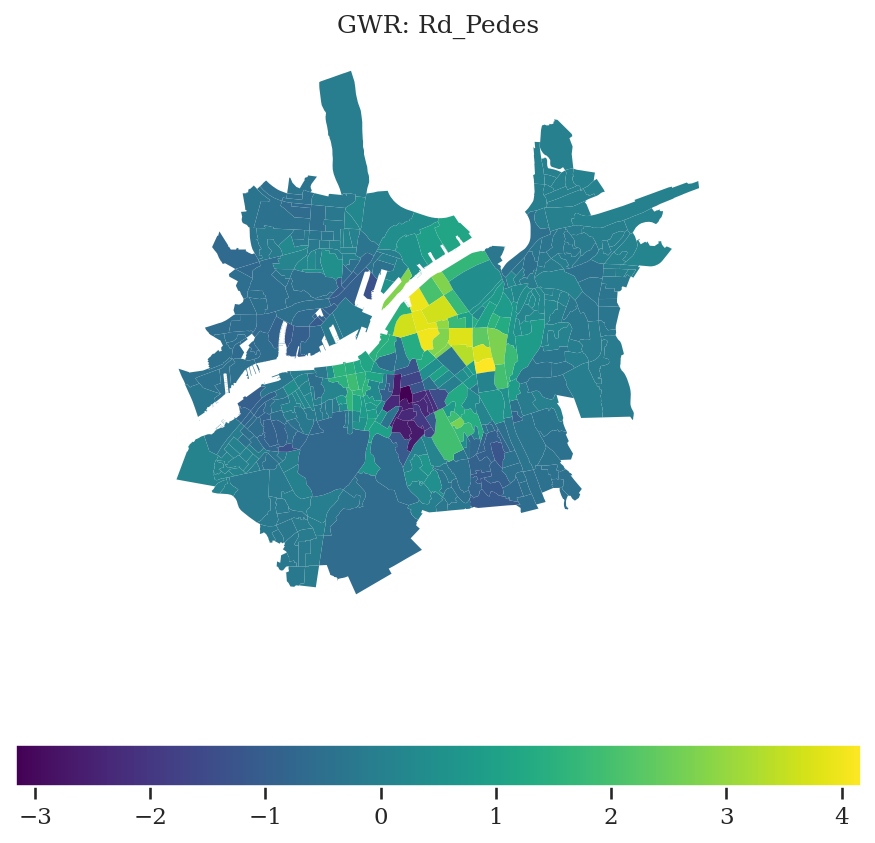

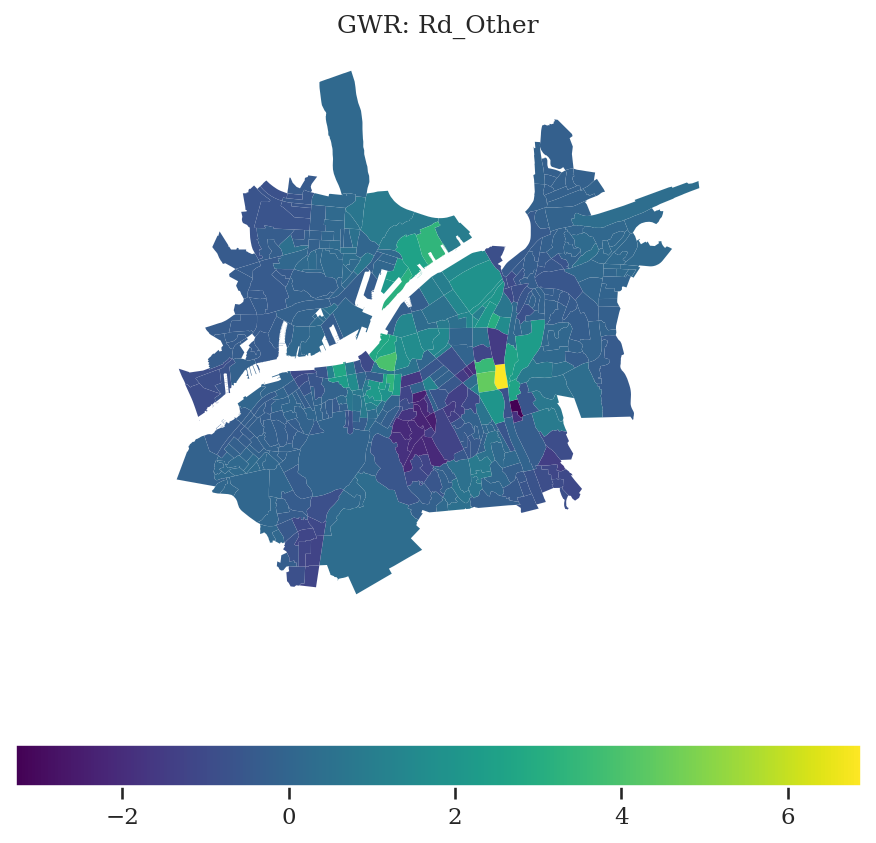

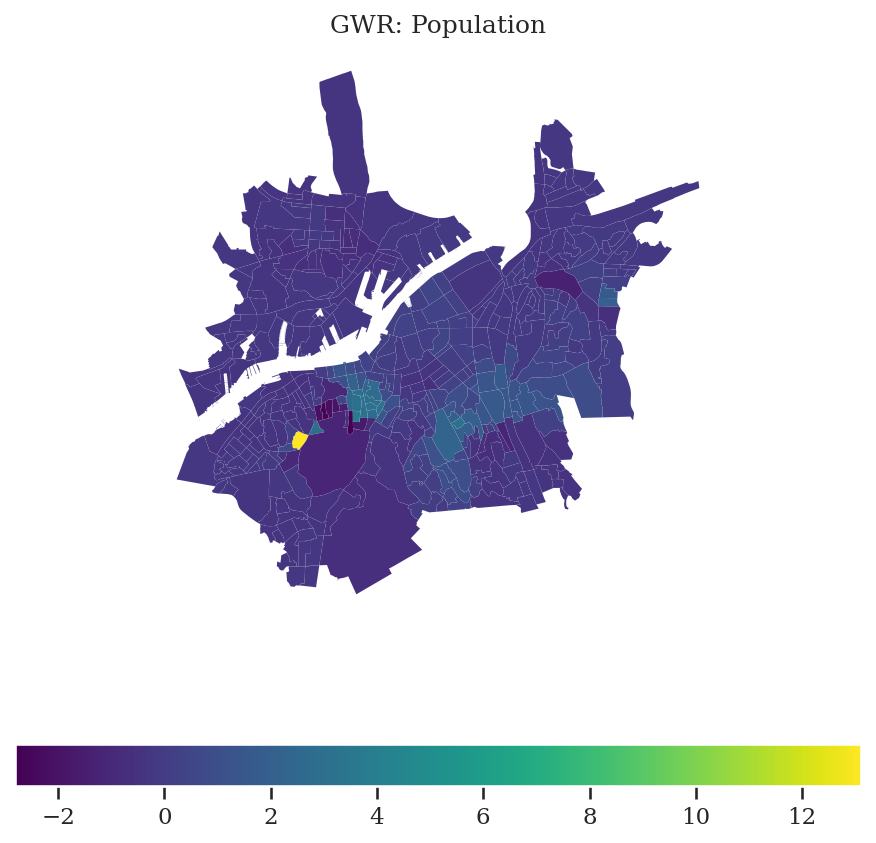

In [24]:
# Standardising the gwr coefficients for comparative stats
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
gwr_coefficient_cols = [col for col in df_gwr.columns if col.startswith('gwr_')]

for col in gwr_coefficient_cols:
    df_gwr[col] = scaler.fit_transform(df_gwr[[col]])

i = 0
for coeff_col in gwr_coefficient_cols:
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    cmap = 'viridis'
    df_gwr.plot(column=coeff_col, cmap=cmap, linewidth=0.01,               # Plotting with equal interval breaks
                legend=True, legend_kwds={'orientation': 'horizontal'}, ax=ax)
    plt.tight_layout()
    ax.axis("off")
    feature_name = coeff_col.replace('gwr_', '')
    ax.set_title(f'GWR: {feature_name}', fontsize=12)
    plt.savefig(f'{i}GWR{feature_name}.png', dpi=150, bbox_inches='tight')
    i += 1
    plt.show()

# MGWR model

In [25]:
df = df.dropna()
y = df['count_trip'].values.reshape(-1, 1)
X = df[['month', 'Day', 'max precip', 'Proportion', 'CarOwnPop', 'Yngpop','Area_m2', 'AreaProx', 'LUP_Commer', 'LUP_Educat', 'LUP_Health',
        'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside', 'Rd_Resi','Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other', 'Population']] 
Zy = (y - y.mean(axis=0)) / y.std(axis=0)
ZX = (X - X.mean(axis=0)) / X.std(axis=0)
coords = df[['x', 'y']].values
df.columns

Index(['month', 'Day', 'max precip', 'Proportion', 'CarOwnPop', 'Yngpop',
       'Area_m2', 'AreaProx', 'LUP_Commer', 'LUP_Educat', 'LUP_Health',
       'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside', 'Rd_Resi',
       'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other', 'Population',
       'count_trip', 'x', 'y', 'BASOMRÅDE', 'geometry', 'gwr_R2', 'gwr_month',
       'gwr_Day', 'gwr_max precip', 'gwr_Proportion', 'gwr_CarOwnPop',
       'gwr_Yngpop', 'gwr_Area_m2', 'gwr_AreaProx', 'gwr_LUP_Commer',
       'gwr_LUP_Educat', 'gwr_LUP_Health', 'gwr_LUP_Other', 'gwr_LUP_Public',
       'gwr_LUP_Recrea', 'gwr_LUP_Reside', 'gwr_Rd_Resi', 'gwr_Rd_Arte',
       'gwr_Rd_Comml', 'gwr_Rd_Cyc', 'gwr_Rd_Pedes', 'gwr_Rd_Other',
       'gwr_Population'],
      dtype='object')

In [26]:
# Checking for columns with zero standard deviation
constant_columns = X.columns[X.std(axis=0) == 0]
print("Constant columns:", constant_columns)
# Re-standardize ZX without the constant column
ZX = (X - X.mean(axis=0)) / X.std(axis=0)
ZX = np.nan_to_num(ZX)

Constant columns: Index([], dtype='object')


In [27]:
start_time = time.time()
print("Current time:", datetime.now())
try:
    print("Starting bandwidth selection...")
    mgwr_selector = Sel_BW(coords, Zy, ZX, multi=True)
    mgwr_bw = mgwr_selector.search()
    end_time = time.time()    # Bandwidth search completed..
    print(f"Bandwidth selected: {mgwr_bw}")
    print(f"Time taken for bandwidth selection: {end_time - start_time:.2f} seconds")

except Exception as e:
    print("Error encountered:", e)
    end_time = time.time()
    print(f"Time elapsed before error: {end_time - start_time:.2f} seconds")

Current time: 2024-01-17 01:25:25.321618
Starting bandwidth selection...
Bandwidth selected: [ 192.   48.   64.  494. 1708. 1710.  502.  106.  500. 1709. 1071.  118.
  400.   64.  335.   64.   56. 1710.  130. 1710. 1709.   50. 1710.]
Time taken for bandwidth selection: 21777.30 seconds


In [28]:
start_time = time.time()
print("Current time:", datetime.now())
try:
    print("Starting MGWR fitting...")
    mgwr_results = MGWR(coords, Zy, ZX, mgwr_selector).fit()
    end_time = time.time()    # MGWR fitting completed
    print(f"Time taken for MGWR fitting: {end_time - start_time:.2f} seconds")
    print("Calculating bandwidth confidence intervals...")
    mgwr_bw_ci = mgwr_results.get_bws_intervals(mgwr_selector)
    print(mgwr_bw_ci)
    print("MGWR Summary:")
    print(mgwr_results.summary())

except Exception as e:
    print("Error encountered:", e)
    end_time = time.time()
    print(f"Time elapsed before error: {end_time - start_time:.2f} seconds")

Current time: 2024-01-17 07:28:22.635908
Starting MGWR fitting...
Time taken for MGWR fitting: 1039.14 seconds
Calculating bandwidth confidence intervals...
[(192.0, 192.0), (47.0, 48.0), (64.0, 64.0), (436.0, 530.0), (1317.0, 1708.0), (1317.0, 1710.0), (436.0, 530.0), (99.0, 106.0), (436.0, 530.0), (1467.0, 1709.0), (1070.0, 1073.0), (99.0, 118.0), (379.0, 436.0), (64.0, 64.0), (335.0, 436.0), (64.0, 64.0), (56.0, 56.0), (1467.0, 1710.0), (129.0, 135.0), (1467.0, 1710.0), (1317.0, 1709.0), (50.0, 50.0), (1317.0, 1710.0)]
MGWR Summary:
Model type                                                         Gaussian
Number of observations:                                                1711
Number of covariates:                                                    23

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            995.711
Log-likelihood:                                    

# Map coefficients for MGWR

In [29]:
df['mgwr_intercept'] = mgwr_results.params[:, 0]
df['mgwr_R2'] = mgwr_results.R2
feature_names = X.columns
for i, feature in enumerate(feature_names, start=1):  # start=1 to skip intercept
    df[f'mgwr_{feature}'] = mgwr_results.params[:, i]

df.columns

Index(['month', 'Day', 'max precip', 'Proportion', 'CarOwnPop', 'Yngpop',
       'Area_m2', 'AreaProx', 'LUP_Commer', 'LUP_Educat', 'LUP_Health',
       'LUP_Other', 'LUP_Public', 'LUP_Recrea', 'LUP_Reside', 'Rd_Resi',
       'Rd_Arte', 'Rd_Comml', 'Rd_Cyc', 'Rd_Pedes', 'Rd_Other', 'Population',
       'count_trip', 'x', 'y', 'BASOMRÅDE', 'geometry', 'gwr_R2', 'gwr_month',
       'gwr_Day', 'gwr_max precip', 'gwr_Proportion', 'gwr_CarOwnPop',
       'gwr_Yngpop', 'gwr_Area_m2', 'gwr_AreaProx', 'gwr_LUP_Commer',
       'gwr_LUP_Educat', 'gwr_LUP_Health', 'gwr_LUP_Other', 'gwr_LUP_Public',
       'gwr_LUP_Recrea', 'gwr_LUP_Reside', 'gwr_Rd_Resi', 'gwr_Rd_Arte',
       'gwr_Rd_Comml', 'gwr_Rd_Cyc', 'gwr_Rd_Pedes', 'gwr_Rd_Other',
       'gwr_Population', 'mgwr_intercept', 'mgwr_R2', 'mgwr_month', 'mgwr_Day',
       'mgwr_max precip', 'mgwr_Proportion', 'mgwr_CarOwnPop', 'mgwr_Yngpop',
       'mgwr_Area_m2', 'mgwr_AreaProx', 'mgwr_LUP_Commer', 'mgwr_LUP_Educat',
       'mgwr_LUP_Health', '

In [30]:
# Filter t-values: standard alpha = 0.05
mgwr_filtered_t = mgwr_results.filter_tvals(alpha = 0.05)

In [31]:
# Since the coefficients are the same for 'BASOMRÅDE', we group and aggregate temporal data.
mgwr_df = df.drop(columns=['x', 'y'])
numeric_cols = mgwr_df.select_dtypes(include=['number']).columns
df_gwr_numeric = mgwr_df.groupby('BASOMRÅDE')[numeric_cols].mean()
df_geometry = mgwr_df.drop_duplicates('BASOMRÅDE')[['BASOMRÅDE', 'geometry']].set_index('BASOMRÅDE')
mgwr_df = df_gwr_numeric.merge(df_geometry, left_index=True, right_index=True)
mgwr_df = gpd.GeoDataFrame(mgwr_df, geometry='geometry')
mgwr_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 445 entries, 10101 to 70902
Data columns (total 72 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   month            445 non-null    float64 
 1   Day              445 non-null    float64 
 2   max precip       445 non-null    float64 
 3   Proportion       445 non-null    float64 
 4   CarOwnPop        445 non-null    float64 
 5   Yngpop           445 non-null    float64 
 6   Area_m2          445 non-null    float64 
 7   AreaProx         445 non-null    float64 
 8   LUP_Commer       445 non-null    float64 
 9   LUP_Educat       445 non-null    float64 
 10  LUP_Health       445 non-null    float64 
 11  LUP_Other        445 non-null    float64 
 12  LUP_Public       445 non-null    float64 
 13  LUP_Recrea       445 non-null    float64 
 14  LUP_Reside       445 non-null    float64 
 15  Rd_Resi          445 non-null    float64 
 16  Rd_Arte          445 non-null    fl

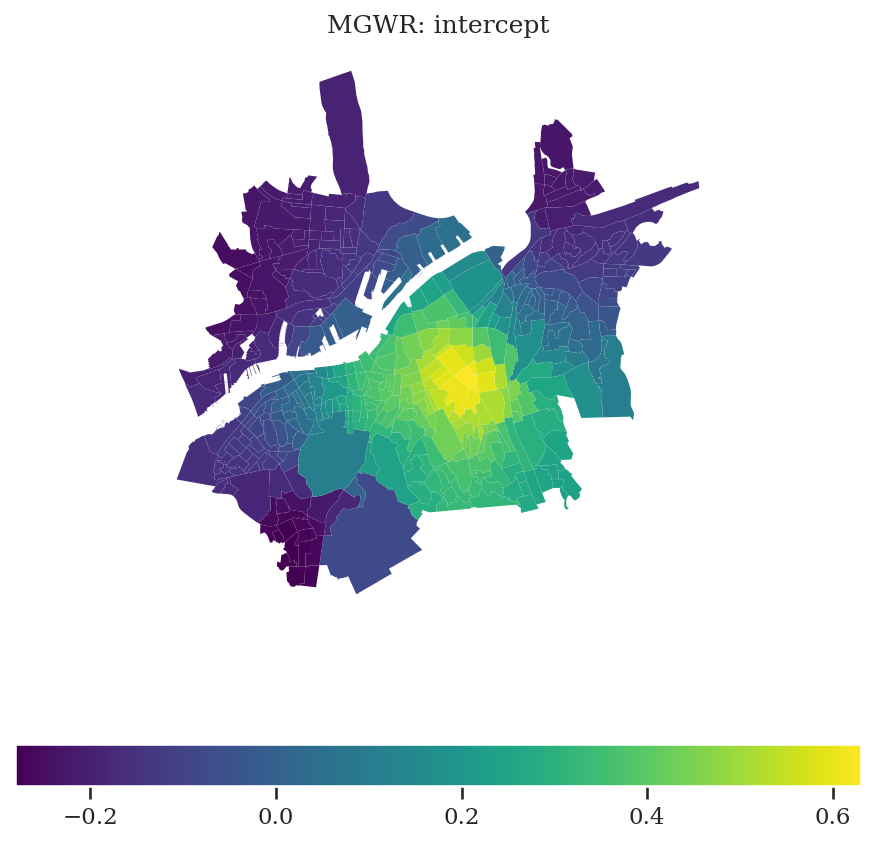

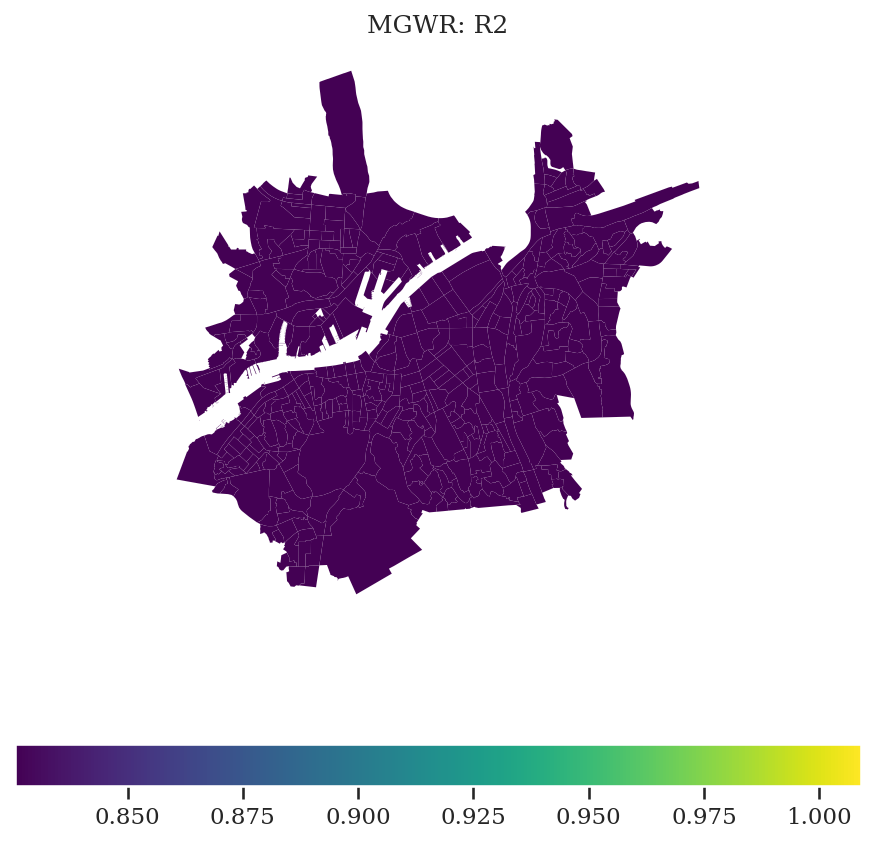

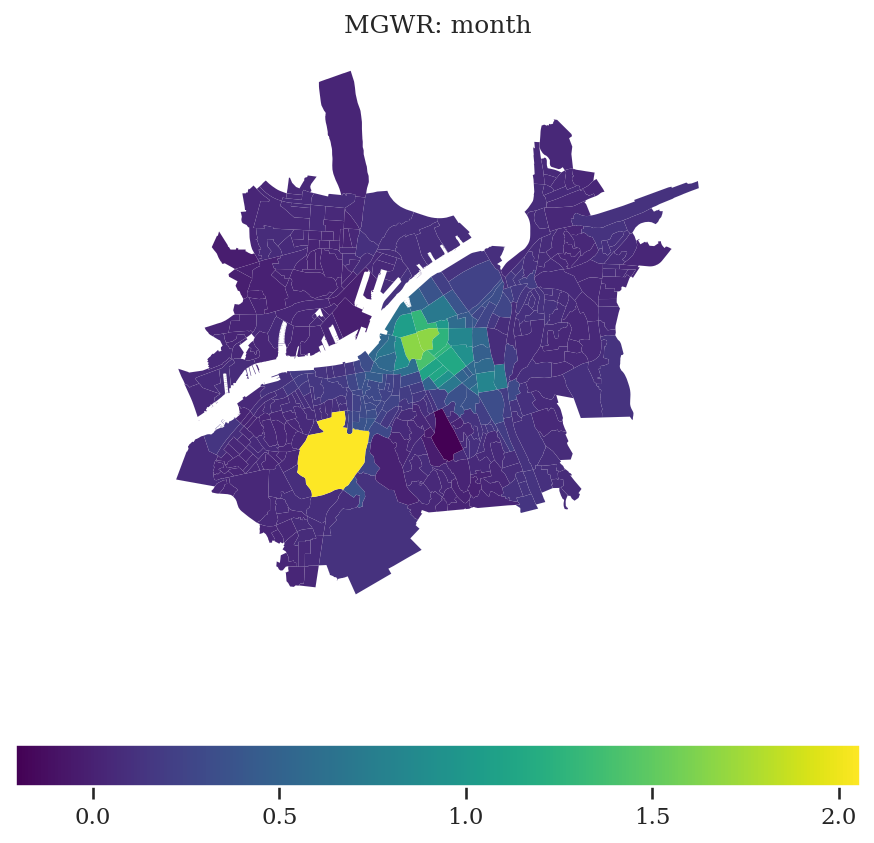

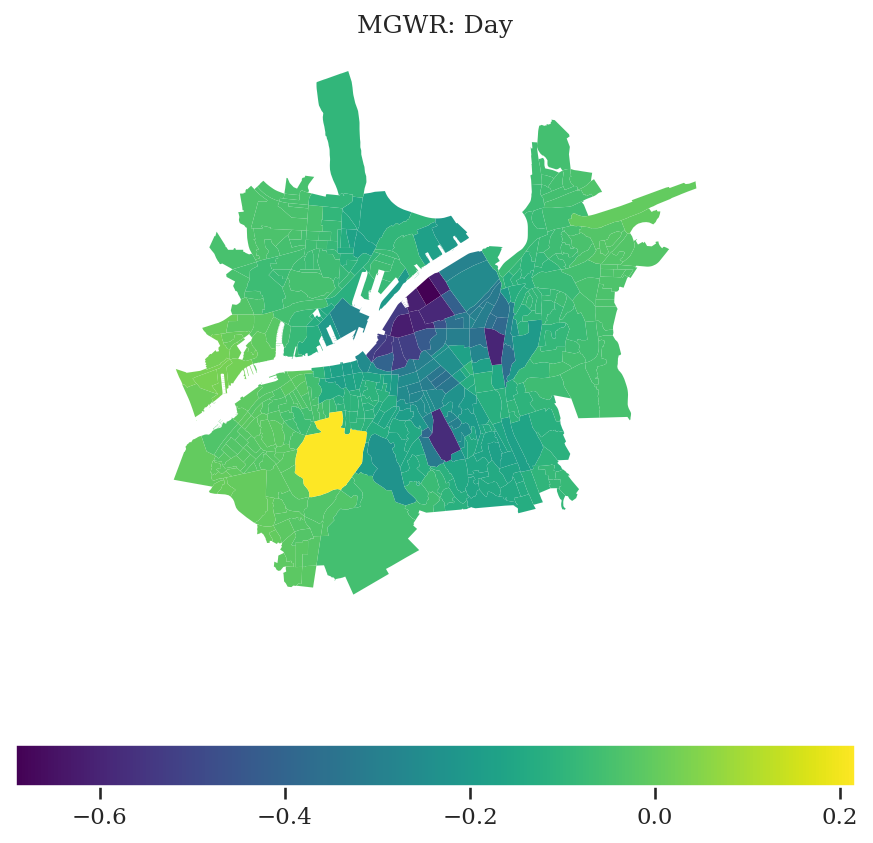

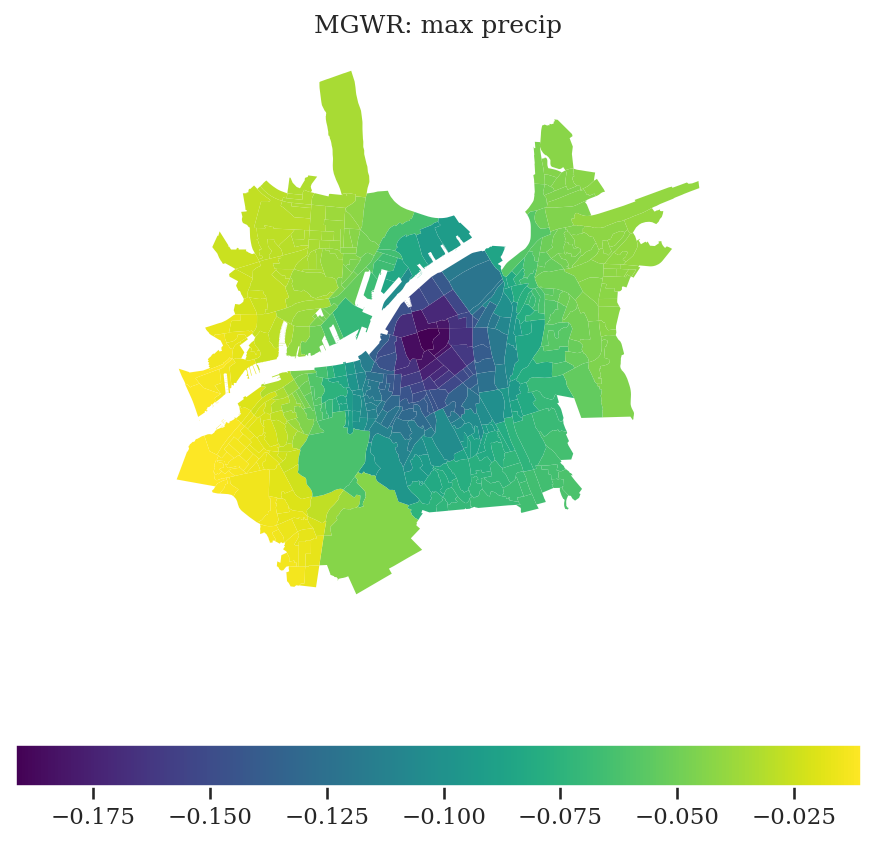

...

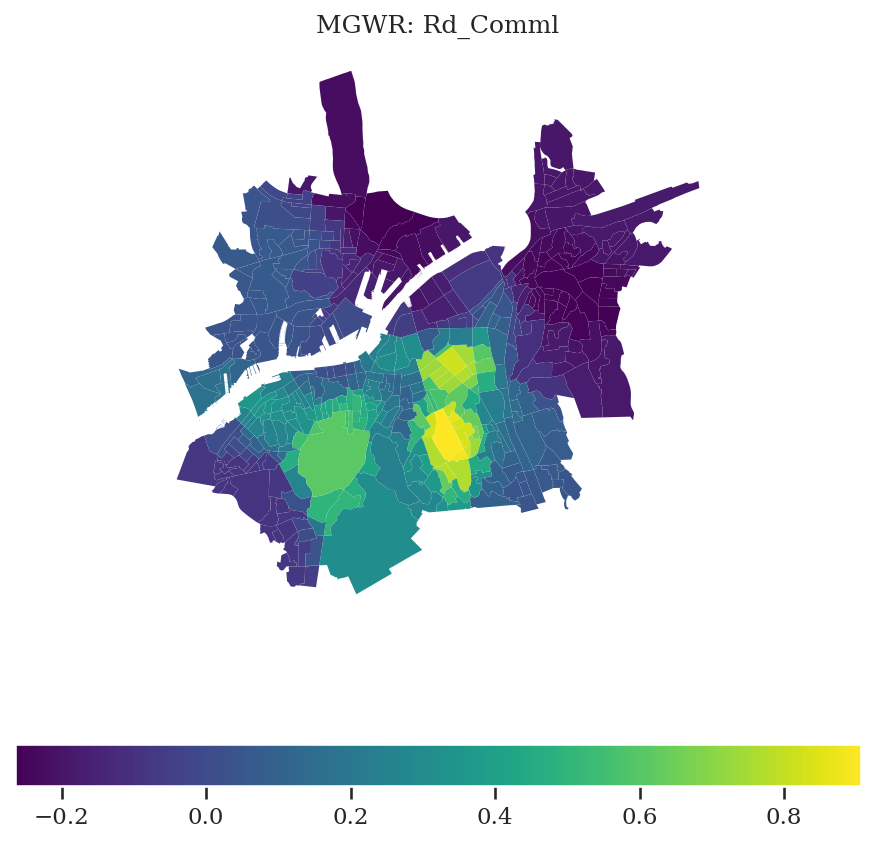

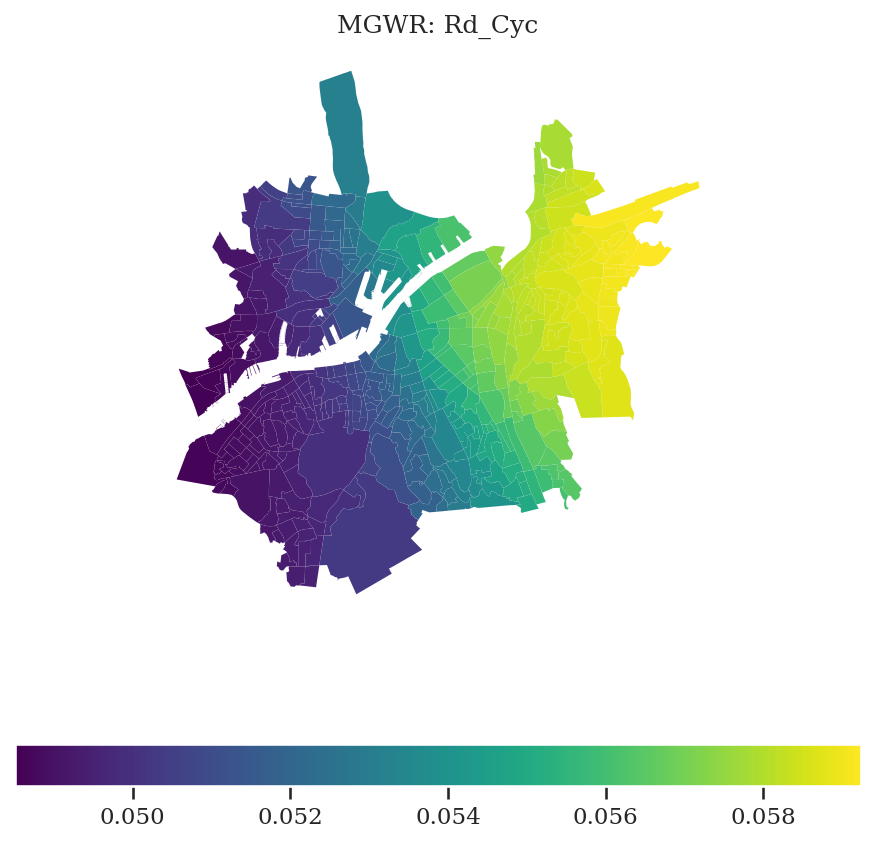

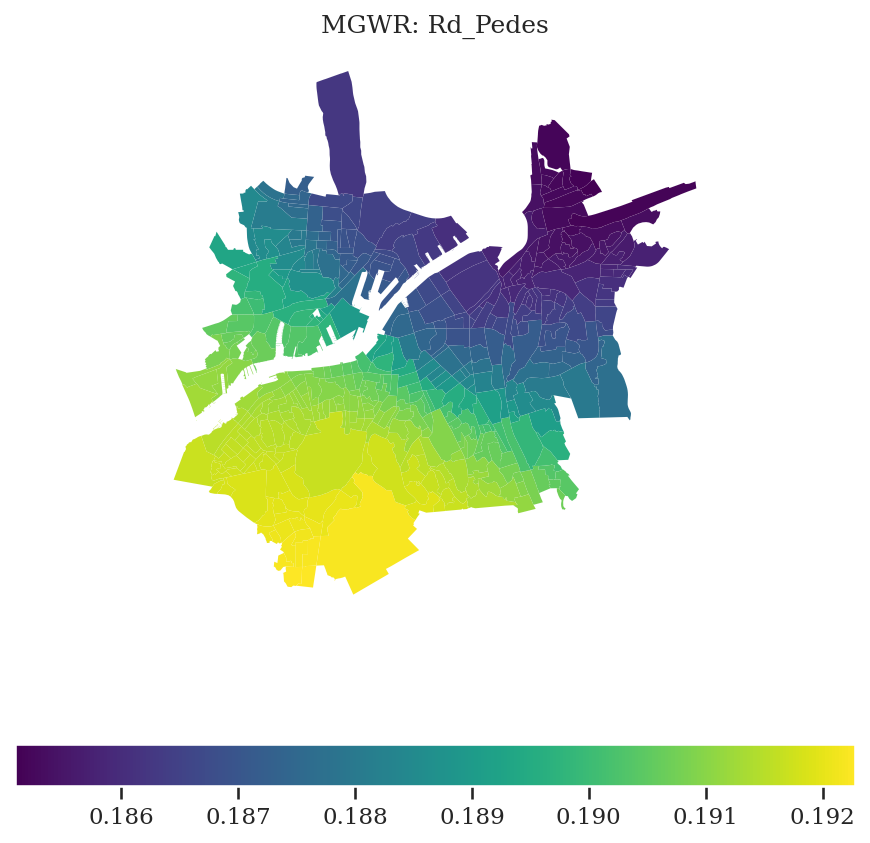

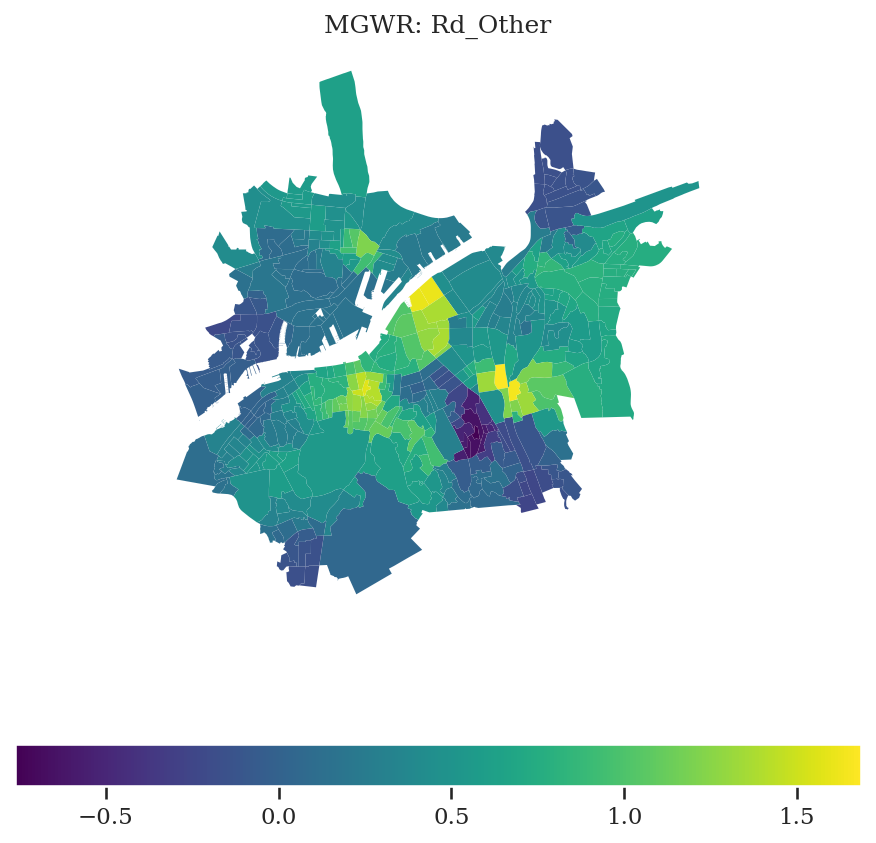

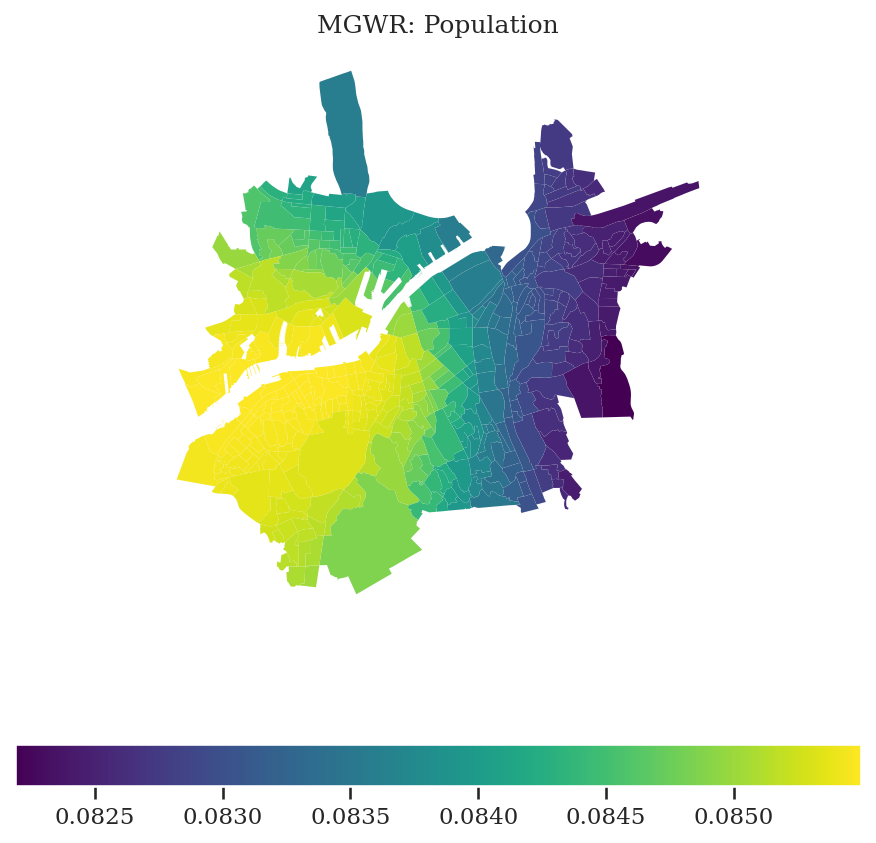

In [32]:
mgwr_coefficient_cols = [col for col in mgwr_df.columns if col.startswith('mgwr_')]
i = 0

for coeff_col in mgwr_coefficient_cols:
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
    cmap = 'viridis'
    mgwr_df.plot(column=coeff_col, cmap=cmap, linewidth=0.01,          # equal interval breaks
                 legend=True, legend_kwds={'orientation': 'horizontal'}, ax=ax)
    plt.tight_layout()
    ax.axis("off")
    feature_name = coeff_col.replace('mgwr_', '')
    ax.set_title(f'MGWR: {feature_name}', fontsize=12)
    plt.savefig(f'{i}_MGWR_{feature_name}.png', dpi=150, bbox_inches='tight')
    i += 1
    plt.show()

In [33]:
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1711 entries, 0 to 1710
Data columns (total 74 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   month            1711 non-null   int64   
 1   Day              1711 non-null   int32   
 2   max precip       1711 non-null   float64 
 3   Proportion       1711 non-null   float64 
 4   CarOwnPop        1711 non-null   float64 
 5   Yngpop           1711 non-null   float64 
 6   Area_m2          1711 non-null   float64 
 7   AreaProx         1711 non-null   float64 
 8   LUP_Commer       1711 non-null   float64 
 9   LUP_Educat       1711 non-null   float64 
 10  LUP_Health       1711 non-null   float64 
 11  LUP_Other        1711 non-null   float64 
 12  LUP_Public       1711 non-null   float64 
 13  LUP_Recrea       1711 non-null   float64 
 14  LUP_Reside       1711 non-null   float64 
 15  Rd_Resi          1711 non-null   float64 
 16  Rd_Arte          1711 non-null   f

In [34]:
output_file_path = "C:/Users/omkarp/OneDrive - Chalmers/GOT_attrib.shp"
df.to_file(output_file_path)

# Test spatial stationarity

In [35]:
# Monte Carlo test of spatial variability: 50 iterations 
gwr_p_values_stationarity = gwr_results.spatial_variability(gwr_selector, 50)
gwr_p_values_stationarity # The first p-value is for the intercept

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0.])

# Test local multicollinearity

In [36]:
LCC, VIF, CN, VDP = gwr_results.local_collinearity()
pd.DataFrame(VIF)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21
0,1.376184,1.440631,1.880888,1.979079,5.813296,4.672810,28.706844,8.253807,3.650815e+14,2.179488e+14,2.807487e+13,2.833184e+14,1.153989e+14,4.405860e+14,5.471584e+14,3.183434,15.684410,5.248818,15.757056,6.450472,5.328396,4.190400
1,1.376184,1.440631,1.880888,1.979079,5.813296,4.672810,28.706844,8.253807,3.650815e+14,2.179488e+14,2.807487e+13,2.833184e+14,1.153989e+14,4.405860e+14,5.471584e+14,3.183434,15.684410,5.248818,15.757056,6.450472,5.328396,4.190400
2,1.376184,1.440631,1.880888,1.979079,5.813296,4.672810,28.706844,8.253807,3.650815e+14,2.179488e+14,2.807487e+13,2.833184e+14,1.153989e+14,4.405860e+14,5.471584e+14,3.183434,15.684410,5.248818,15.757056,6.450472,5.328396,4.190400
3,1.376184,1.440631,1.880888,1.979079,5.813296,4.672810,28.706844,8.253807,3.650815e+14,2.179488e+14,2.807487e+13,2.833184e+14,1.153989e+14,4.405860e+14,5.471584e+14,3.183434,15.684410,5.248818,15.757056,6.450472,5.328396,4.190400
4,1.368965,1.436832,1.870226,1.916782,6.486061,7.827761,9.679510,3.987566,-8.230826e+14,-4.132444e+14,-6.636204e+13,-6.017662e+14,-2.398188e+14,-8.344297e+14,-1.256256e+15,2.887716,5.522500,8.906485,8.257497,3.086565,8.860884,4.724494
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1706,1.313309,1.438376,1.914544,8.392842,8.846417,1.938049,26.784425,2.392061,7.969645e+14,1.250896e+15,5.926180e+14,1.235965e+15,2.888607e+14,2.760615e+15,2.866158e+15,5.479600,4.867209,19.656546,4.099202,62.651593,3.146385,3.405343
1707,1.313309,1.438376,1.914544,8.392842,8.846417,1.938049,26.784425,2.392061,7.969645e+14,1.250896e+15,5.926180e+14,1.235965e+15,2.888607e+14,2.760615e+15,2.866158e+15,5.479600,4.867209,19.656546,4.099202,62.651593,3.146385,3.405343
1708,1.313309,1.438376,1.914544,8.392842,8.846417,1.938049,26.784425,2.392061,7.969645e+14,1.250896e+15,5.926180e+14,1.235965e+15,2.888607e+14,2.760615e+15,2.866158e+15,5.479600,4.867209,19.656546,4.099202,62.651593,3.146385,3.405343
1709,1.270108,1.316340,1.660439,2.389429,16.383131,7.861312,11.808485,7.470788,2.570151e+01,5.272811e+00,2.379618e+00,1.493136e+01,5.373020e+00,1.512961e+01,5.793772e+01,11.983473,6.052040,9.522778,12.803760,3.181820,3.762535,5.085562


In [37]:
pd.DataFrame(VIF).describe().round(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21
count,1699.00,1699.00,1699.00,1699.00,1699.00,1699.00,1699.00,1699.00,1.699000e+03,1.699000e+03,1.699000e+03,1.699000e+03,1.699000e+03,1.699000e+03,1.699000e+03,1699.00,1699.00,1699.00,1699.00,1699.00,1699.00,1699.00
mean,1.49,1.71,2.25,4.04,7.35,6.59,39.91,12.67,4.833888e+14,2.611729e+14,1.141355e+14,6.102595e+14,6.384137e+13,6.664968e+14,9.775652e+14,8.49,8.93,20.16,8.89,23.82,13.54,5.82
std,0.13,0.22,0.32,2.47,4.52,5.32,69.42,19.91,7.300789e+15,5.185020e+15,2.261046e+15,5.604442e+15,9.155818e+14,9.830405e+15,1.230274e+16,6.61,10.82,42.75,7.19,62.26,22.68,3.72
min,1.20,1.26,1.53,1.31,1.93,1.42,4.27,2.14,-2.964548e+16,-2.057896e+16,-1.589458e+16,-1.033475e+16,-7.650103e+15,-4.163039e+16,-4.114037e+16,2.16,1.00,1.81,2.32,1.99,1.00,1.89
25%,1.37,1.50,1.97,2.32,4.24,3.06,11.85,4.96,-4.254553e+14,-1.233702e+14,-3.105765e+13,-1.125304e+14,-6.080309e+13,-3.360652e+14,-6.711357e+14,4.42,3.16,5.70,4.60,4.50,4.32,3.47
50%,1.51,1.71,2.28,3.21,6.30,5.04,19.77,7.85,1.167000e+01,3.530000e+00,3.870000e+00,8.680000e+00,3.800000e+00,6.310000e+00,1.093000e+01,6.42,4.94,9.79,6.66,7.65,7.77,4.83
75%,1.60,1.92,2.55,5.04,8.86,8.36,37.44,12.59,4.622195e+14,1.415746e+14,3.222277e+13,1.835161e+14,7.201247e+13,3.995836e+14,6.219561e+14,10.19,9.30,20.25,10.78,16.69,12.58,6.90
max,1.73,2.11,2.79,19.20,36.97,40.74,643.50,246.87,9.459025e+16,7.734328e+16,3.374069e+16,7.309010e+16,1.038434e+16,1.470698e+17,1.702761e+17,49.21,71.39,621.34,63.19,677.90,197.45,33.79


In [38]:
pd.DataFrame(CN)

,0
0,2.652175e+15
1,2.652175e+15
2,2.652175e+15
3,2.652175e+15
4,2.860541e+15
...,...
1706,4.546311e+15
1707,4.546311e+15
1708,4.546311e+15
1709,9.595874e+01


In [39]:
data['gwr_CN'] = CN

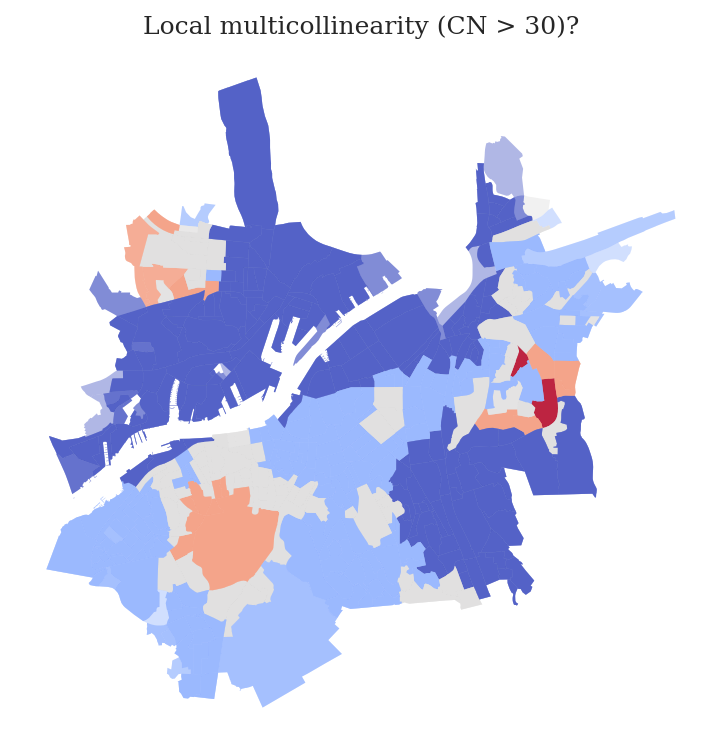

In [40]:
fig, ax = plt.subplots(figsize=(6, 6))
data.plot(column='gwr_CN', cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=False, 
         legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=ax, alpha=0.4)
ax.set_title('Local multicollinearity (CN > 30)?', fontsize=12)
ax.axis("off")
plt.savefig('gwr_CN.png',dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
output_file = 'GWR_values.shp'
data.to_file(output_file)